In [72]:
%matplotlib inline
import matplotlib as mlp
mlp.rcParams['figure.dpi'] = 150

# diasbling warning messages
import warnings
warnings.filterwarnings("ignore")

# notebook dependencies
import pandas as pd
# pd.set_option('display.max_rows', None, 'display.max_columns', None)
import numpy as np

#visualizations
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style = "darkgrid")

# math modules
from math import sqrt
import math
import scipy.stats as stats

import acquire
import prepare

# sklearn data science library
from sklearn.experimental import enable_iterative_imputer
from sklearn.metrics import mean_squared_error
from scipy.stats.mstats import winsorize

from sklearn.impute import IterativeImputer
from sklearn.cluster import KMeans

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score

from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler, PolynomialFeatures
from sklearn.linear_model import LinearRegression, LassoLars, TweedieRegressor, LogisticRegression


from sklearn.decomposition import PCA 
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import HistGradientBoostingClassifier

from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold

In [73]:
# pull-in the data

df = acquire.get_bach_df()
df = prepare.clean_college_df(df)
df = prepare.clean_high_percentage_nulls(df)

df = prepare.obtain_target_variables(df)
df.head()

dataframe shape: (71901, 139)
dataframe shape: (71901, 117)
dataframe shape: (71422, 127)


,unit_id_institution,college_name,institution_control,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,...,2017,2018,2019,Grand Total,roi_5yr,pct_roi_5yr,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr
0,100654.0,Alabama A & M University,Public,AL,35762,Normal,5.0,1.0,3.0,3.0,...,57605.6889,55517.8694,61388.9338,174512.4921,0.4062,40.6166,1.9900,198.9979,5.6693,566.9295
1,100654.0,Alabama A & M University,Public,AL,35762,Normal,5.0,1.0,3.0,3.0,...,57605.6889,55517.8694,61388.9338,174512.4921,0.4062,40.6166,1.9900,198.9979,5.6693,566.9295
2,100858.0,Auburn University,Public,AL,36849,Auburn,5.0,1.0,3.0,3.0,...,57605.6889,55517.8694,61388.9338,174512.4921,0.1989,19.8891,1.5492,154.9242,4.6862,468.6210
3,100858.0,Auburn University,Public,AL,36849,Auburn,5.0,1.0,3.0,3.0,...,57605.6889,55517.8694,61388.9338,174512.4921,0.1989,19.8891,1.5492,154.9242,4.6862,468.6210
4,101541.0,Judson College,"Private, nonprofit",AL,36756,Marion,5.0,1.0,3.0,3.0,...,57605.6889,55517.8694,61388.9338,174512.4921,0.3512,35.1246,1.8732,187.3202,5.4088,540.8818


In [74]:
# additional transformations

df = prepare.create_fam_income_columns(df)
df = prepare.impute_avg_net_price(df)
df = prepare.impute_debt(df)

# create regions column
df['us_region'] = df.apply(lambda row: prepare.label_states(row), axis=1)

df.head(3)

dataframe shape: (71422, 112)


,unit_id_institution,college_name,institution_control,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,...,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,us_region
0,100654.0,Alabama A & M University,Public,AL,35762,Normal,5.0,1.0,3.0,3.0,...,1.9900,198.9979,5.6693,566.9295,375.0,113.0,61.0,27.0,16.0,east_south_central
1,100654.0,Alabama A & M University,Public,AL,35762,Normal,5.0,1.0,3.0,3.0,...,1.9900,198.9979,5.6693,566.9295,375.0,113.0,61.0,27.0,16.0,east_south_central
2,100858.0,Auburn University,Public,AL,36849,Auburn,5.0,1.0,3.0,3.0,...,1.5492,154.9242,4.6862,468.6210,254.0,155.0,166.0,201.0,364.0,east_south_central


In [75]:
# checking percentage of nulls across features
null_percentages = df.isnull().mean().round(2)

with pd.option_context('display.max_rows', None):
    print(null_percentages.sort_index().sort_values(ascending=False))

first_time_pt_student_retention                     0.34
comp_rt_ft_150over_expected_time_native_american    0.28
comp_rt_ft_150over_expected_time_unknown_race       0.19
comp_rt_ft_150over_expected_time_non_resident       0.19
graduate_number                                     0.17
comp_rt_ft_150over_expected_time_asian              0.16
comp_rt_ft_150over_expected_time_two_races          0.16
on_campus_cost_of_attendace                         0.14
required_score                                      0.14
non_deg_seeking                                     0.11
comp_rt_ft_150over_expected_time_black              0.09
comp_rt_ft_150over_expected_time_hispanic           0.09
comp_rt_ft_150over_expected_time_white              0.08
first_time_ft_student_retention                     0.08
off_campus_cost_of_attendace                        0.08
comp_rt_ft_150over_expected_time                    0.06
share_entering_students_first_ft                    0.06
pell_grant_full_time_first_time

----
### ``Initial Data Split``


In [76]:
# splitting the data

train, validate, test = prepare.split_data(df)

train shape: (39995, 113)
validate shape: (17142, 113)
test shape: (14285, 113)


In [77]:
# handle outliers in datasets

train = prepare.percentile_capping(train, 0.1, 0.1)
validate = prepare.percentile_capping(validate, 0.1, 0.1)
test = prepare.percentile_capping(test, 0.1, 0.1)

train.head(3)

,unit_id_institution,college_name,institution_control,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,...,roi_10yr,pct_roi_10yr,roi_20yr,pct_roi_20yr,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,us_region
25530,220862.0,University of Memphis,Public,TN,38152,Memphis,5.0,1.0,3.0,3.0,...,1.9370,193.7021,5.5278,552.7786,559.0,300.0,248.0,186.0,209.0,east_south_central
53875,218238.0,Limestone University,"Private, nonprofit",SC,29340-3799,Gaffney,5.0,1.0,3.0,3.0,...,1.7703,177.0293,5.1729,517.2892,106.0,51.0,57.0,39.0,49.0,east_south_atlantic
42932,228459.0,Texas State University,Public,TX,78666,San Marcos,6.0,1.0,3.0,3.0,...,1.5812,158.1241,4.7455,474.5477,559.0,300.0,303.0,274.0,471.0,midwest_south_central


In [78]:
# train and impute training dataset

train_imputed = prepare.train_iterative_imputer(train)

# check remaining nulls
remaining_nulls = train_imputed.isnull().sum()

with pd.option_context('display.max_rows', None):
    print(remaining_nulls.sort_index().sort_values(ascending = False))

median_debt_non_first_generation                    2262
2017                                                   0
major_code                                             0
institution_control                                    0
income_over_110000                                     0
income_75001_110000                                    0
income_48001_75000                                     0
income_30001_48000                                     0
income_0_30000                                         0
graduate_number                                        0
full_time_net_tuition_revenue                          0
first_time_pt_student_retention                        0
first_time_ft_student_retention                        0
fedral_loan_full_time_first_time_undergraduate         0
enrollment_share_white                                 0
enrollment_share_unknown                               0
enrollment_share_two_races                             0
enrollment_share_pac_islander  

In [79]:
# impute missing values in validate and test 

validate_imputed, test_imputed = prepare.impute_val_and_test(train, validate, test)
print(f'validate shape: {validate_imputed.shape}')
print(f'test shape: {test_imputed.shape}')

validate shape: (17142, 113)
test shape: (14285, 113)


-----
### ``Clustering Pre-processing``


In [80]:
# descriptive stats

summary_stats = train_imputed.describe().T
summary_stats["range"] = summary_stats["max"] -summary_stats["min"]

summary_stats.sort_index().sort_values(by = "range", ascending = False)

,count,mean,std,min,25%,50%,75%,max,range
Grand Total,39995.0,182400.891033,41884.366526,109223.6751,152359.8077,169831.2865,224509.2128,277838.8858,168615.2107
unit_id_institution,39995.0,187218.748619,36751.862178,128771.0000,154235.0000,192749.0000,217633.0000,238458.0000,109687.0000
2019,39995.0,63161.494375,14605.305457,31651.8518,53039.5451,58422.9839,79448.6061,100554.8761,68903.0243
2017,39995.0,58961.803782,13576.891557,37639.5652,49080.4862,54382.3219,72585.5295,97692.3077,60052.7425
2018,39995.0,60277.592870,13983.789970,35450.0000,50004.5409,56419.9476,72475.0773,91686.8839,56236.8839
...,...,...,...,...,...,...,...,...,...
deg_percent_awarded_military_tech,39995.0,0.000000,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
deg_percent_awarded_personal_culinary_services,39995.0,0.000000,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
deg_percent_awarded_science_tech,39995.0,0.000000,0.000000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000
degree_code,39995.0,3.000000,0.000000,3.0000,3.0000,3.0000,3.0000,3.0000,0.0000


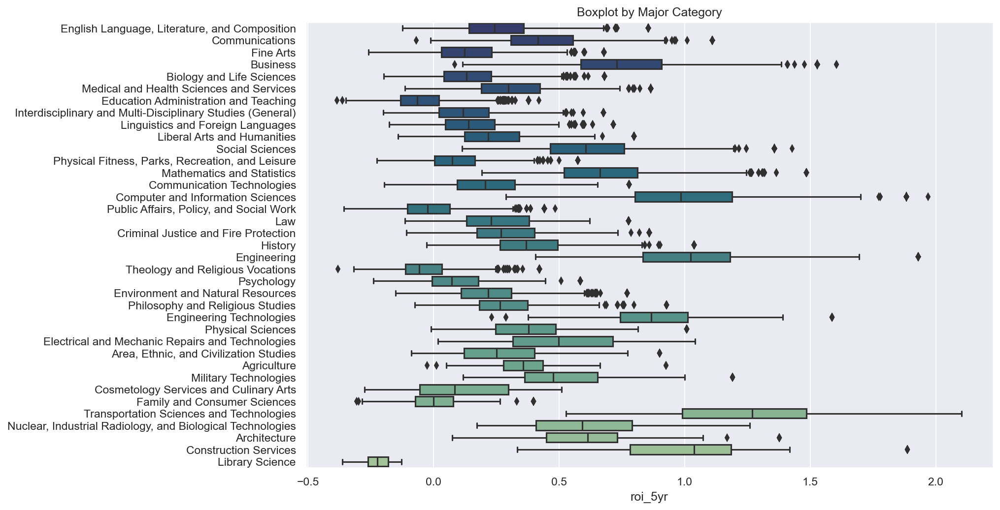

In [81]:
# central tendency at 5yr roi period by major

plt.figure(figsize = (12, 8))

sns.boxplot(
    x = "roi_5yr",
    y = "major_category",
    data = train_imputed,
    orient = "h",
    palette = "crest_r"
)

plt.title("Boxplot by Major Category")
plt.ylabel(None)
plt.show()

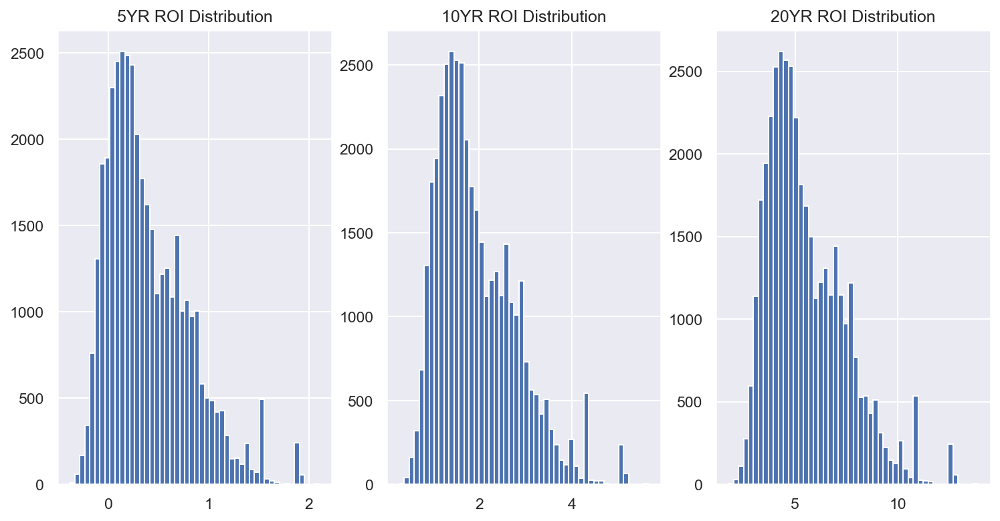

In [82]:
# side-by-side comparison of target variables

plt.subplots(nrows = 1, ncols = 2, figsize = (12, 6))

plt.subplot(131)
plt.title("5YR ROI Distribution")
plt.hist(train_imputed["roi_5yr"], bins = 50)

plt.subplot(132)
plt.title("10YR ROI Distribution")
plt.hist(train_imputed["roi_10yr"], bins = 50)

plt.subplot(133)
plt.title("20YR ROI Distribution")
plt.hist(train_imputed["roi_20yr"], bins = 50)

plt.show()

``additional variable creation``

In [83]:
# retrieve newly created "first-time, full-time student bins" column

train_imputed, validate_imputed, test_imputed = prepare.get_share_bins(train_imputed, validate_imputed, test_imputed)

train shape: (39995, 116)
validate shape: (17142, 116)
test shape: (14285, 116)


``Creating Dummy Variables``

In [84]:
# create dummy datasets w/passed categorical columns

train_dummy, validate_dummy, test_dummy = prepare.get_dummy_dataframes(train_imputed, validate_imputed, test_imputed)

train shape: (39995, 173)
validate shape: (17142, 173)
test shape: (14285, 173)


``Scale Continuous Variables``

In [85]:
# identify continuous variables to scale - exclusive of target variables

cont_lst = train_dummy.select_dtypes(exclude = ["object", "category", "uint8", "int64", "bool"]).columns.tolist()

target_lst = [ 
        "roi_5yr",
        "roi_10yr",
        "roi_20yr",
        "pct_roi_5yr",
        "pct_roi_10yr",
        "pct_roi_20yr",
        "2017",                                               
        "2018",                                                   
        "2019",
        "Grand Total",
        "avg_net_price"
        ]

# final continuous variables list
cont_lst = [col for col in cont_lst if col not in target_lst]

In [86]:
# transform datasets

scaler = RobustScaler()

# fit scaled on training dataset
scaler.fit(train_dummy[cont_lst])

# transform dummy datasets
train_dummy[cont_lst] = scaler.transform(train_dummy[cont_lst])
validate_dummy[cont_lst] = scaler.transform(validate_dummy[cont_lst])
test_dummy[cont_lst] = scaler.transform(test_dummy[cont_lst])

# give new dataframe names
train_scaled = train_dummy
validate_scaled = validate_dummy
test_scaled = test_dummy

# non-dummy datasets (can be used for future comparison purposes)
train_imputed[cont_lst] = scaler.transform(train_imputed[cont_lst])
validate_imputed[cont_lst] = scaler.transform(validate_imputed[cont_lst])
test_imputed[cont_lst] = scaler.transform(test_imputed[cont_lst])

# inspect the dataset
train_scaled.head() # checks out!

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,...,us_region_west_pacific,admission_rate_binned_very_competitive,admission_rate_binned_somewhat_competitive,admission_rate_binned_competitive,admission_rate_binned_average_acceptance,admission_rate_binned_above_average_acceptance,SAT_binned_average_sat,SAT_binned_above_average_sat,SAT_binned_competitive_sat,SAT_binned_very_competitive_sat
25530,0.443437,University of Memphis,TN,38152,Memphis,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,False,True,False,True,False,False
53875,0.402047,Limestone University,SC,29340-3799,Gaffney,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,True,False,False,False,False,True,False,False,False
42932,0.563267,Texas State University,TX,78666,San Marcos,0.50,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,True,False,False,True,False,False
45495,-0.732042,Judson University,IL,60123-1498,Elgin,-0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,True,False,True,False,False,False
25003,0.078220,Yeshiva University,NY,10033-3299,New York,-0.50,0.0,0.0,0.0,Bachelors Degree,...,False,False,True,False,False,False,False,False,False,True


----
### ``Cluster Number 1: Admission Rate Cluster``


In [87]:
# setting features to cluster on 

X_admission = train_scaled[[
'income_48001_75000',
'admission_rate_binned_very_competitive',	
'admission_rate_binned_somewhat_competitive',	
'admission_rate_binned_competitive',	
'admission_rate_binned_average_acceptance',	
'admission_rate_binned_above_average_acceptance'
    ]]

# validate df
X_val = validate_scaled[[
'income_48001_75000',
'admission_rate_binned_very_competitive',	
'admission_rate_binned_somewhat_competitive',	
'admission_rate_binned_competitive',	
'admission_rate_binned_average_acceptance',	
'admission_rate_binned_above_average_acceptance'
    ]]

# test df
X_test = test_scaled[[
'income_48001_75000',
'admission_rate_binned_very_competitive',	
'admission_rate_binned_somewhat_competitive',	
'admission_rate_binned_competitive',	
'admission_rate_binned_average_acceptance',	
'admission_rate_binned_above_average_acceptance'
    ]]

X_admission.head()

,income_48001_75000,admission_rate_binned_very_competitive,admission_rate_binned_somewhat_competitive,admission_rate_binned_competitive,admission_rate_binned_average_acceptance,admission_rate_binned_above_average_acceptance
25530,1.429688,False,False,False,False,True
53875,-0.062500,True,False,False,False,False
42932,1.859375,False,False,False,True,False
45495,-0.218750,False,False,False,True,False
25003,-0.242188,False,True,False,False,False


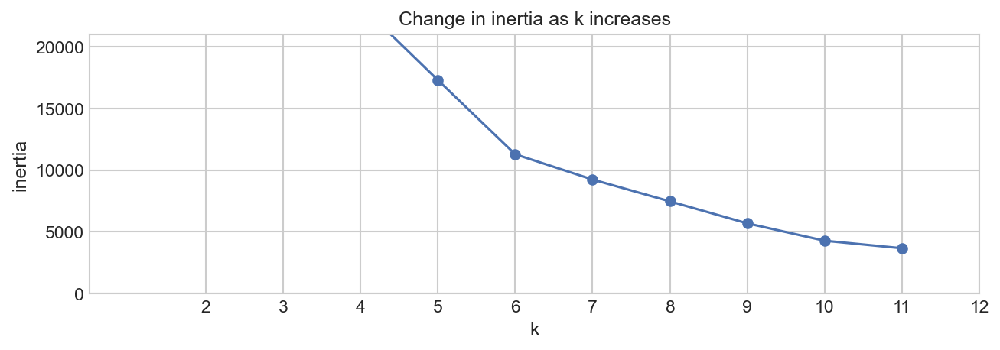

In [88]:
# KMeans Elbow-method

with plt.style.context('seaborn-whitegrid'):

    plt.figure(figsize=(10, 3))
    pd.Series({k: KMeans(k).fit(X_admission).inertia_ for k in range(1, 12)}).plot(marker = 'o')
    plt.xticks(range(2, 13))
    
    plt.ylim(0, 21000)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

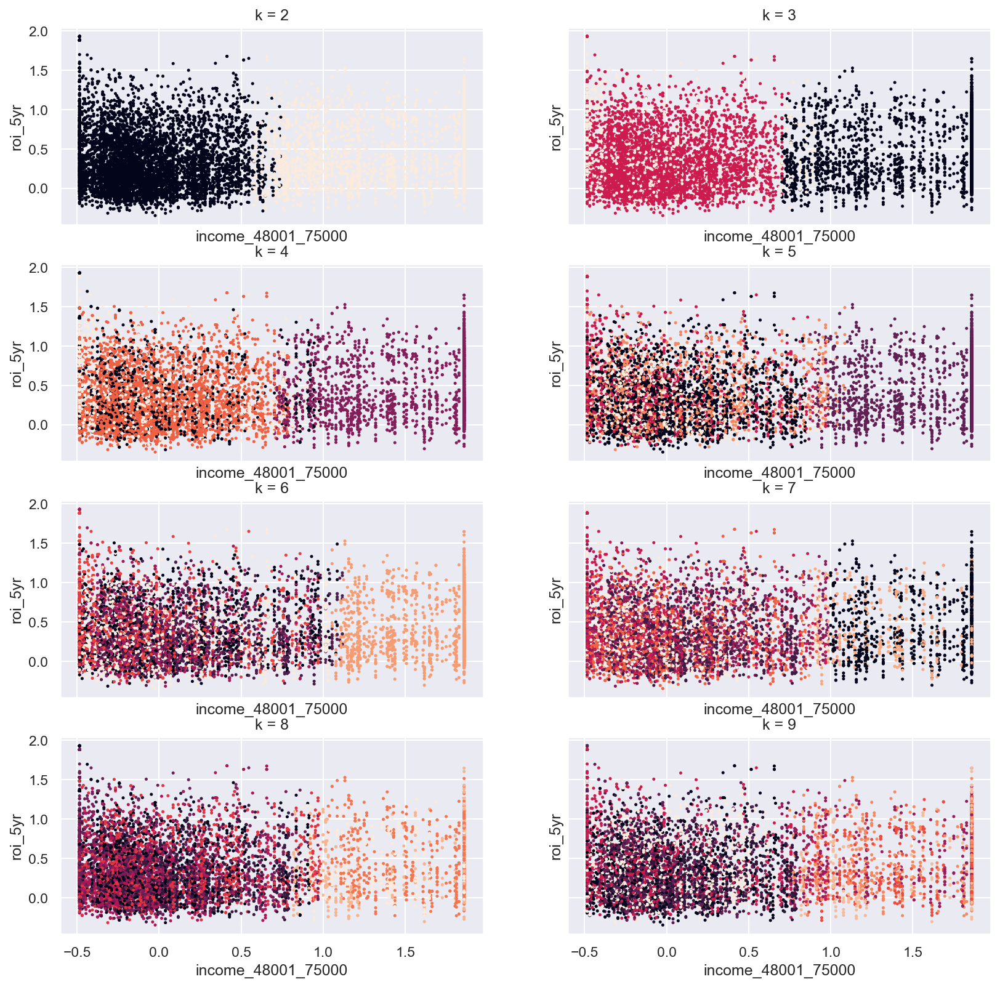

In [89]:
# plotting inertia for number of KMeans clusters

fig, axs = plt.subplots(4, 2, figsize=(13, 13), sharex=True, sharey=True)

for ax, k in zip(axs.ravel(), range(2, 13)):
    
    X1 = X_admission.sample(10000, random_state = 123)

    # creating and fitting KMeans
    clusters = KMeans(k).fit(X1).predict(X1)

    X1["roi_5yr"] = train_scaled["roi_5yr"]

    ax.scatter(
        X1["income_48001_75000"],
        X1["roi_5yr"],
        c = clusters,
        s = 2)

    ax.set(title='k = {}'.format(k), xlabel = 'income_48001_75000', ylabel = 'roi_5yr')

In [90]:
# measure correlation

ref_coeff = 0

for n_cluster in range(2, 11):

    kmeans = KMeans(n_clusters = n_cluster).fit(X1)

    label = kmeans.labels_

    sil_coeff = silhouette_score(X1, label, metric='euclidean')
    rel_coeff = (sil_coeff - ref_coeff)/ref_coeff
    ref_coeff = sil_coeff
    
    print("For n_clusters = {}, The Relative Silhouette Coefficient is {:.4f} and relative difference of {:.3f}".format(n_cluster, sil_coeff, rel_coeff))

For n_clusters = 2, The Relative Silhouette Coefficient is 0.3156 and relative difference of inf
For n_clusters = 3, The Relative Silhouette Coefficient is 0.2713 and relative difference of -0.140
For n_clusters = 4, The Relative Silhouette Coefficient is 0.3413 and relative difference of 0.258
For n_clusters = 5, The Relative Silhouette Coefficient is 0.4204 and relative difference of 0.232
For n_clusters = 6, The Relative Silhouette Coefficient is 0.4975 and relative difference of 0.183
For n_clusters = 7, The Relative Silhouette Coefficient is 0.5013 and relative difference of 0.008
For n_clusters = 8, The Relative Silhouette Coefficient is 0.5220 and relative difference of 0.041
For n_clusters = 9, The Relative Silhouette Coefficient is 0.5380 and relative difference of 0.031
For n_clusters = 10, The Relative Silhouette Coefficient is 0.5278 and relative difference of -0.019


In [91]:
# initial fitting of KMeans cluster

kmeans = KMeans(n_clusters = 5)
kmeans.fit(X_admission)

train_clusters = kmeans.predict(X_admission)

In [92]:
# creating cluster for ea. dataset 

train_admission_clusters = kmeans.predict(X_admission)
val_admission_clusters = kmeans.predict(X_val)
test_admission_clusters = kmeans.predict(X_test)

# viewing cluster samples
pd.DataFrame(train_admission_clusters).rename(columns = {0: "Cluster Sample"}).sample(10, random_state = 123)

,Cluster Sample
21417,2
28667,3
7477,0
24935,0
24966,0
7142,0
30603,0
7930,1
31203,3
1107,4


In [93]:
# adding clusters back to original datasets

train_scaled["admission_clusters_5yr"] = train_admission_clusters
validate_scaled["admission_clusters_5yr"] = val_admission_clusters
test_scaled["admission_clusters_5yr"] = test_admission_clusters

train_scaled.head()

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,...,admission_rate_binned_very_competitive,admission_rate_binned_somewhat_competitive,admission_rate_binned_competitive,admission_rate_binned_average_acceptance,admission_rate_binned_above_average_acceptance,SAT_binned_average_sat,SAT_binned_above_average_sat,SAT_binned_competitive_sat,SAT_binned_very_competitive_sat,admission_clusters_5yr
25530,0.443437,University of Memphis,TN,38152,Memphis,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,True,False,True,False,False,4
53875,0.402047,Limestone University,SC,29340-3799,Gaffney,0.25,0.0,0.0,0.0,Bachelors Degree,...,True,False,False,False,False,True,False,False,False,0
42932,0.563267,Texas State University,TX,78666,San Marcos,0.50,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,True,False,False,True,False,False,4
45495,-0.732042,Judson University,IL,60123-1498,Elgin,-0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,True,False,True,False,False,False,3
25003,0.078220,Yeshiva University,NY,10033-3299,New York,-0.50,0.0,0.0,0.0,Bachelors Degree,...,False,True,False,False,False,False,False,False,True,2


In [94]:
# printing average admissions rate by admission cluster

unique_clusters = sorted(train_scaled["admission_clusters_5yr"].unique().tolist())

container = []

for cluster in unique_clusters:
    
    metric = {
    'admission cluster': cluster,
    'admission rate': round(train_scaled[train_scaled["admission_clusters_5yr"] == cluster]["admission_rate"].mean(), 3),
    'min 5YR ROI': round(train_scaled[train_scaled["admission_clusters_5yr"] == cluster]["roi_5yr"].min(), 3),
    'max 5YR ROI': round(train_scaled[train_scaled["admission_clusters_5yr"] == cluster]["roi_5yr"].max(), 3),
    'range of 5YR ROI': round((train_scaled[train_scaled["admission_clusters_5yr"] == cluster]["roi_5yr"].max() - train_scaled[train_scaled["admission_clusters_5yr"] == cluster]["roi_5yr"].min()), 2),
    'average 5YR ROI': round(train_scaled[train_scaled["admission_clusters_5yr"] == cluster]["roi_5yr"].mean(), 3)
    }

    container.append(metric)

cluster_description = pd.DataFrame(container).sort_values(by = "average 5YR ROI", ascending = False).reset_index(drop = True)
cluster_description

,admission cluster,admission rate,min 5YR ROI,max 5YR ROI,range of 5YR ROI,average 5YR ROI
0,1,-0.015,-0.295,2.103,2.40,0.549
1,4,-0.080,-0.339,1.804,2.14,0.430
2,2,-0.344,-0.363,1.930,2.29,0.396
3,0,-0.132,-0.385,1.930,2.32,0.327
4,3,0.373,-0.322,1.930,2.25,0.303


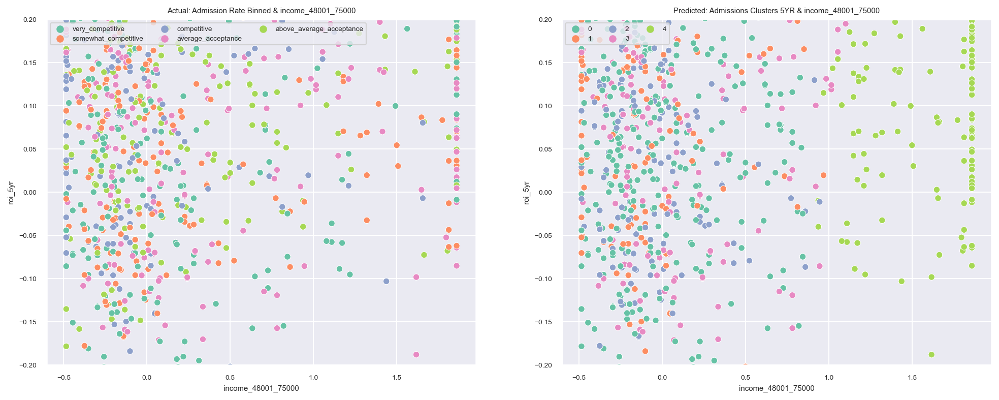

In [95]:
# seeing how month clusters compare against actual month and home age

sns.set(font_scale = 0.6)
plt.subplots(1, 2, figsize = (16, 6), sharex = False, sharey = False)

plt.subplot(121)
sns.scatterplot(
        x = "income_48001_75000",
        y = "roi_5yr",
        data = train_imputed.sample(2000, random_state = 123), 
        hue = "admission_rate_binned",
        palette = ['#66c2a5','#fc8d62','#8da0cb','#e78ac3','#a6d854']
)

plt.title("Actual: Admission Rate Binned & income_48001_75000")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)

plt.subplot(122)
sns.scatterplot(
        x = "income_48001_75000",
        y = "roi_5yr",
        data = train_scaled.sample(2000, random_state = 123), 
        hue = "admission_clusters_5yr",
        palette = ['#66c2a5','#fc8d62','#8da0cb','#e78ac3','#a6d854']
)

plt.title("Predicted: Admissions Clusters 5YR & income_48001_75000")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)
plt.show()

----
### ``Cluster Number 2: Institution Control``


In [96]:
# setting features to cluster on 

X_control = train_scaled[[
    'admission_rate',
    'institution_control_Foreign',
    'institution_control_Private, for-profit',
    'institution_control_Private, nonprofit',
    'institution_control_Public'
    ]]

# validate df
X_val = validate_scaled[[
    'admission_rate',
    'institution_control_Foreign',
    'institution_control_Private, for-profit',
    'institution_control_Private, nonprofit',
    'institution_control_Public'
    ]]

# test df
X_test = test_scaled[[
    'admission_rate',
    'institution_control_Foreign',
    'institution_control_Private, for-profit',
    'institution_control_Private, nonprofit',
    'institution_control_Public'
    ]]

X_control.head()

,admission_rate,institution_control_Foreign,"institution_control_Private, for-profit","institution_control_Private, nonprofit",institution_control_Public
25530,0.754616,False,False,False,True
53875,-1.195821,False,False,True,False
42932,0.437804,False,False,False,True
45495,0.108844,False,False,True,False
25003,-0.412536,False,False,True,False


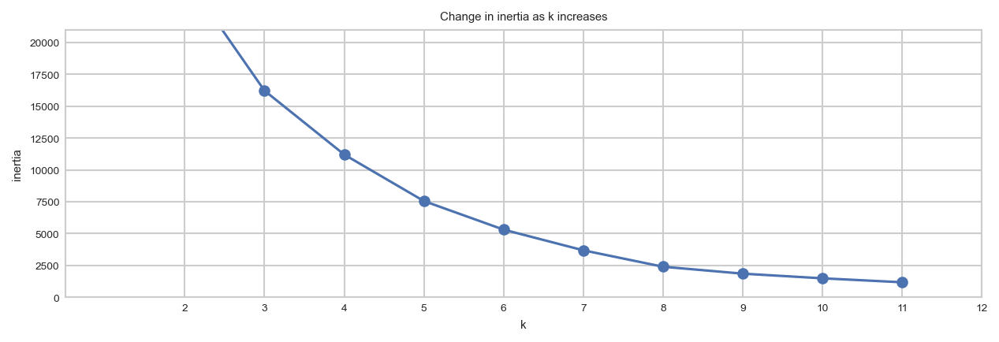

In [97]:
# KMeans Elbow-method

with plt.style.context('seaborn-whitegrid'):

    plt.figure(figsize=(10, 3))
    pd.Series({k: KMeans(k).fit(X_control).inertia_ for k in range(1, 12)}).plot(marker = 'o')
    plt.xticks(range(2, 13))
    
    plt.ylim(0, 21000)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

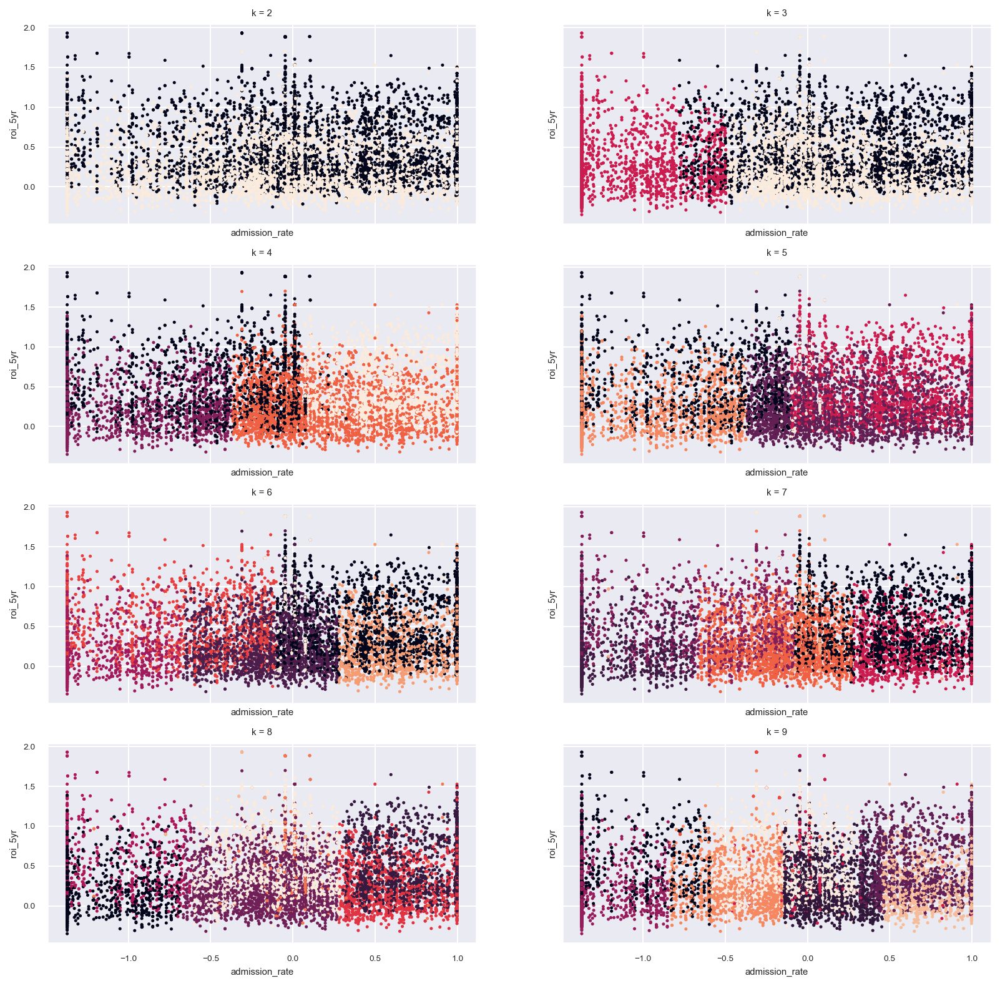

In [98]:
# plotting inertia for number of KMeans clusters

fig, axs = plt.subplots(4, 2, figsize=(13, 13), sharex=True, sharey=True)

for ax, k in zip(axs.ravel(), range(2, 13)):
    
    X2 = X_control.sample(10000, random_state = 123)

    # creating and fitting KMeans
    clusters = KMeans(k).fit(X2).predict(X2)

    X2["roi_5yr"] = train_scaled["roi_5yr"]

    ax.scatter(
        X2["admission_rate"],
        X2["roi_5yr"],
        c = clusters,
        s = 2)

    ax.set(title='k = {}'.format(k), xlabel = 'admission_rate', ylabel = 'roi_5yr')

In [99]:
ref_coeff = 0

for n_cluster in range(2, 11):

    kmeans = KMeans(n_clusters = n_cluster).fit(X2)

    label = kmeans.labels_

    sil_coeff = silhouette_score(X2, label, metric='euclidean')
    rel_coeff = (sil_coeff - ref_coeff)/ref_coeff
    ref_coeff = sil_coeff
    
    print("For n_clusters = {}, The Relative Silhouette Coefficient is {:.4f} and relative difference of {:.3f}".format(n_cluster, sil_coeff, rel_coeff))

For n_clusters = 2, The Relative Silhouette Coefficient is 0.4049 and relative difference of inf
For n_clusters = 3, The Relative Silhouette Coefficient is 0.4032 and relative difference of -0.004
For n_clusters = 4, The Relative Silhouette Coefficient is 0.4032 and relative difference of -0.000
For n_clusters = 5, The Relative Silhouette Coefficient is 0.4539 and relative difference of 0.126
For n_clusters = 6, The Relative Silhouette Coefficient is 0.4340 and relative difference of -0.044
For n_clusters = 7, The Relative Silhouette Coefficient is 0.4203 and relative difference of -0.032
For n_clusters = 8, The Relative Silhouette Coefficient is 0.4385 and relative difference of 0.043
For n_clusters = 9, The Relative Silhouette Coefficient is 0.4372 and relative difference of -0.003
For n_clusters = 10, The Relative Silhouette Coefficient is 0.4404 and relative difference of 0.007


In [100]:
# fitting of KMeans n_cluster to 3

kmeans = KMeans(n_clusters = 3)
kmeans.fit(X_control)

train_clusters = kmeans.predict(X_control)

In [101]:
# creating cluster for ea. dataset 

train_control_clusters = kmeans.predict(X_control)
val_control_clusters = kmeans.predict(X_val)
test_control_clusters = kmeans.predict(X_test)

# viewing cluster samples
pd.DataFrame(train_control_clusters).rename(columns = {0: "Cluster Sample"}).sample(10, random_state = 123)

,Cluster Sample
21417,0
28667,0
7477,0
24935,1
24966,0
7142,0
30603,2
7930,1
31203,0
1107,1


In [102]:
# adding clusters back to original datasets

train_scaled["control_clusters_5yr"] = train_control_clusters
validate_scaled["control_clusters_5yr"] = val_control_clusters
test_scaled["control_clusters_5yr"] = test_control_clusters

train_scaled.head()

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,...,admission_rate_binned_somewhat_competitive,admission_rate_binned_competitive,admission_rate_binned_average_acceptance,admission_rate_binned_above_average_acceptance,SAT_binned_average_sat,SAT_binned_above_average_sat,SAT_binned_competitive_sat,SAT_binned_very_competitive_sat,admission_clusters_5yr,control_clusters_5yr
25530,0.443437,University of Memphis,TN,38152,Memphis,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,True,False,True,False,False,4,1
53875,0.402047,Limestone University,SC,29340-3799,Gaffney,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,True,False,False,False,0,2
42932,0.563267,Texas State University,TX,78666,San Marcos,0.50,0.0,0.0,0.0,Bachelors Degree,...,False,False,True,False,False,True,False,False,4,1
45495,-0.732042,Judson University,IL,60123-1498,Elgin,-0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,True,False,True,False,False,False,3,0
25003,0.078220,Yeshiva University,NY,10033-3299,New York,-0.50,0.0,0.0,0.0,Bachelors Degree,...,True,False,False,False,False,False,False,True,2,0


In [103]:
# printing average admissions rate by control cluster

unique_clusters = sorted(train_scaled["control_clusters_5yr"].unique().tolist())

container = []

for cluster in unique_clusters:
    
    metric = {
    'control cluster': cluster,
    'admission rate': round(train_scaled[train_scaled["control_clusters_5yr"] == cluster]["admission_rate"].mean(), 3),
    'min 5YR ROI': round(train_scaled[train_scaled["control_clusters_5yr"] == cluster]["roi_5yr"].min(), 3),
    'max 5YR ROI': round(train_scaled[train_scaled["control_clusters_5yr"] == cluster]["roi_5yr"].max(), 3),
    'range of 5YR ROI': round((train_scaled[train_scaled["control_clusters_5yr"] == cluster]["roi_5yr"].max() - train_scaled[train_scaled["control_clusters_5yr"] == cluster]["roi_5yr"].min()), 2),
    'average 5YR ROI': round(train_scaled[train_scaled["control_clusters_5yr"] == cluster]["roi_5yr"].mean(), 3)
    }

    container.append(metric)

cluster_description = pd.DataFrame(container).sort_values(by = "average 5YR ROI", ascending = False).reset_index(drop = True)
cluster_description

,control cluster,admission rate,min 5YR ROI,max 5YR ROI,range of 5YR ROI,average 5YR ROI
0,1,0.220,-0.289,2.103,2.39,0.545
1,2,-1.115,-0.385,1.930,2.32,0.307
2,0,0.265,-0.322,1.930,2.25,0.273


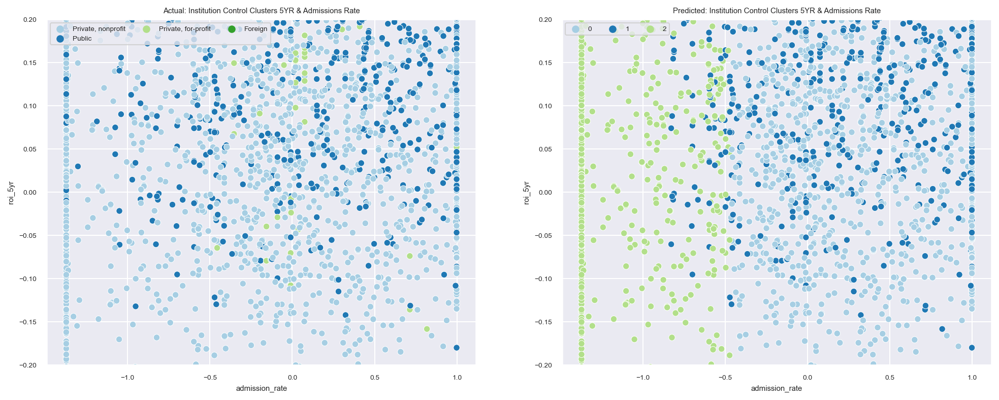

In [104]:
# seeing how month clusters compare against actual month and home age

sns.set(font_scale = 0.6)
plt.subplots(1, 2, figsize = (16, 6), sharex = False, sharey = False)

plt.subplot(121)
sns.scatterplot(
        x = "admission_rate",
        y = "roi_5yr",
        data = train_imputed.sample(5000, random_state = 123), 
        hue = "institution_control",
        palette = ['#a6cee3','#1f78b4','#b2df8a','#33a02c']
)

plt.title("Actual: Institution Control Clusters 5YR & Admissions Rate")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)

plt.subplot(122)
sns.scatterplot(
        x = "admission_rate",
        y = "roi_5yr",
        data = train_scaled.sample(5000, random_state = 123), 
        hue = "control_clusters_5yr",
        palette = ['#a6cee3','#1f78b4','#b2df8a']
)

plt.title("Predicted: Institution Control Clusters 5YR & Admissions Rate")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)
plt.show()

----
### **``Cluster Number 3: University Region Cluster``**

In [105]:
# setting features to cluster on 

X_region = train_scaled[[
    'full_time_net_tuition_revenue',
    'us_region_east_north_atlantic',	
    'us_region_east_north_central',	
    'us_region_east_south_atlantic',	
    'us_region_east_south_central',	
    'us_region_midwest_north_central',	
    'us_region_midwest_south_central',	
    'us_region_us_foreign',
    'us_region_west_mountain',
    'us_region_west_pacific'
    ]]

# validate df
X_val = validate_scaled[[
    'full_time_net_tuition_revenue',
    'us_region_east_north_atlantic',	
    'us_region_east_north_central',	
    'us_region_east_south_atlantic',	
    'us_region_east_south_central',	
    'us_region_midwest_north_central',	
    'us_region_midwest_south_central',	
    'us_region_us_foreign',
    'us_region_west_mountain',
    'us_region_west_pacific'
    ]]

# test df
X_test = test_scaled[[
    'full_time_net_tuition_revenue',
    'us_region_east_north_atlantic',	
    'us_region_east_north_central',	
    'us_region_east_south_atlantic',	
    'us_region_east_south_central',	
    'us_region_midwest_north_central',	
    'us_region_midwest_south_central',	
    'us_region_us_foreign',
    'us_region_west_mountain',
    'us_region_west_pacific'
    ]]

X_region.head()

,full_time_net_tuition_revenue,us_region_east_north_atlantic,us_region_east_north_central,us_region_east_south_atlantic,us_region_east_south_central,us_region_midwest_north_central,us_region_midwest_south_central,us_region_us_foreign,us_region_west_mountain,us_region_west_pacific
25530,-0.446191,False,False,False,True,False,False,False,False,False
53875,0.046191,False,False,True,False,False,False,False,False,False
42932,-0.416483,False,False,False,False,False,True,False,False,False
45495,-0.205367,False,True,False,False,False,False,False,False,False
25003,0.502156,True,False,False,False,False,False,False,False,False


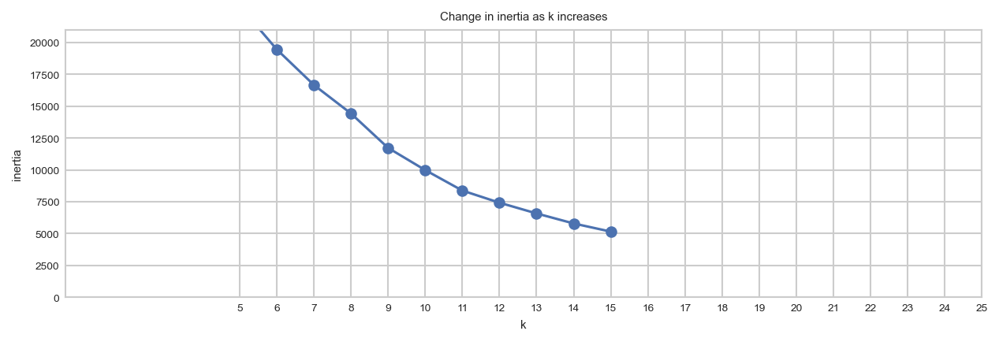

In [106]:
# KMeans Elbow-method

with plt.style.context('seaborn-whitegrid'):

    plt.figure(figsize = (10, 3))
    pd.Series({k: KMeans(k).fit(X_region).inertia_ for k in range(1, 16)}).plot(marker = 'o')
    plt.xticks(range(5, 26))
    
    plt.ylim(0, 21000)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

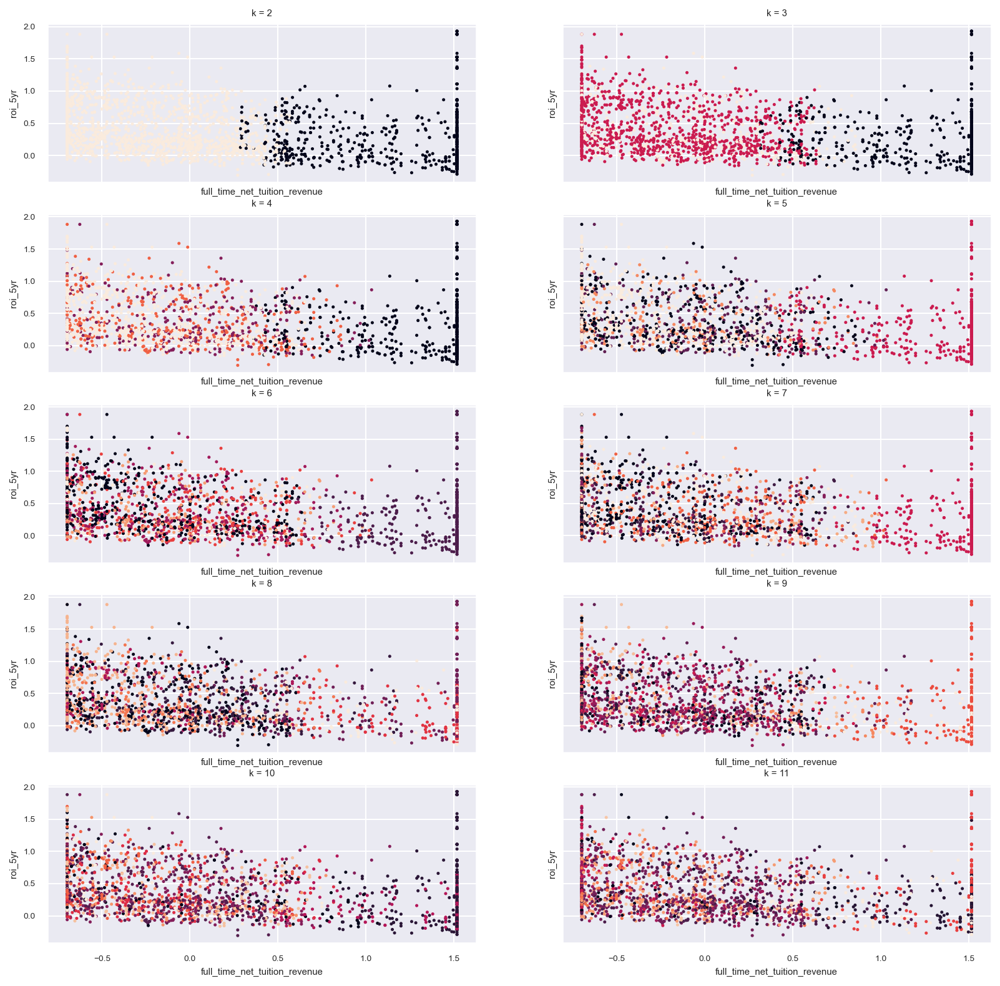

In [107]:
# plotting inertia for number of KMeans clusters

fig, axs = plt.subplots(5, 2, figsize=(13, 13), sharex=True, sharey=True)

for ax, k in zip(axs.ravel(), range(2, 16)):
    
    X3 = X_region.sample(2000, random_state = 123)

    # creating and fitting KMeans
    clusters = KMeans(k).fit(X3).predict(X3)

    X3["roi_5yr"] = train_scaled["roi_5yr"]

    ax.scatter(
        X3["full_time_net_tuition_revenue"],
        X3["roi_5yr"],
        c = clusters,
        s = 2)

    ax.set(title='k = {}'.format(k), xlabel = 'full_time_net_tuition_revenue', ylabel = 'roi_5yr')

In [108]:
ref_coeff = 0

for n_cluster in range(2, 13):

    kmeans = KMeans(n_clusters = n_cluster).fit(X3)

    label = kmeans.labels_

    sil_coeff = silhouette_score(X3, label, metric = 'euclidean')
    rel_coeff = (sil_coeff - ref_coeff)/ref_coeff
    ref_coeff = sil_coeff
    print("For n_clusters = {}, The Relative Silhouette Coefficient is {:.4f} and relative difference of {:.3f}".format(n_cluster, sil_coeff, rel_coeff))

# obtaining the best coefficient results at n_clusters = 5: using sklearn silhouette coefficient method

For n_clusters = 2, The Relative Silhouette Coefficient is 0.2632 and relative difference of inf
For n_clusters = 3, The Relative Silhouette Coefficient is 0.2249 and relative difference of -0.146
For n_clusters = 4, The Relative Silhouette Coefficient is 0.2946 and relative difference of 0.310
For n_clusters = 5, The Relative Silhouette Coefficient is 0.3121 and relative difference of 0.060
For n_clusters = 6, The Relative Silhouette Coefficient is 0.3598 and relative difference of 0.153
For n_clusters = 7, The Relative Silhouette Coefficient is 0.3958 and relative difference of 0.100
For n_clusters = 8, The Relative Silhouette Coefficient is 0.4306 and relative difference of 0.088
For n_clusters = 9, The Relative Silhouette Coefficient is 0.4549 and relative difference of 0.057
For n_clusters = 10, The Relative Silhouette Coefficient is 0.4882 and relative difference of 0.073
For n_clusters = 11, The Relative Silhouette Coefficient is 0.4969 and relative difference of 0.018
For n_clu

In [109]:
# fitting of KMeans cluster to n_cluster 9

kmeans = KMeans(n_clusters = 9)
kmeans.fit(X_region)

train_clusters = kmeans.predict(X_region)

In [110]:
# creating cluster for ea. dataset 

train_region_clusters_5yr = kmeans.predict(X_region)
val_region_clusters_5yr = kmeans.predict(X_val)
test_region_clusters_5yr = kmeans.predict(X_test)

# viewing cluster samples
pd.DataFrame(train_region_clusters_5yr).rename(columns = {0: "Cluster Sample"}).sample(10, random_state = 123)

,Cluster Sample
21417,8
28667,4
7477,0
24935,0
24966,3
7142,2
30603,2
7930,2
31203,0
1107,0


In [111]:
# adding clusters back to original datasets

train_scaled["region_clusters_5yr"] = train_region_clusters_5yr
validate_scaled["region_clusters_5yr"] = val_region_clusters_5yr
test_scaled["region_clusters_5yr"] = test_region_clusters_5yr

train_scaled.head()

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,...,admission_rate_binned_competitive,admission_rate_binned_average_acceptance,admission_rate_binned_above_average_acceptance,SAT_binned_average_sat,SAT_binned_above_average_sat,SAT_binned_competitive_sat,SAT_binned_very_competitive_sat,admission_clusters_5yr,control_clusters_5yr,region_clusters_5yr
25530,0.443437,University of Memphis,TN,38152,Memphis,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,True,False,True,False,False,4,1,7
53875,0.402047,Limestone University,SC,29340-3799,Gaffney,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,True,False,False,False,0,2,2
42932,0.563267,Texas State University,TX,78666,San Marcos,0.50,0.0,0.0,0.0,Bachelors Degree,...,False,True,False,False,True,False,False,4,1,5
45495,-0.732042,Judson University,IL,60123-1498,Elgin,-0.25,0.0,0.0,0.0,Bachelors Degree,...,False,True,False,True,False,False,False,3,0,3
25003,0.078220,Yeshiva University,NY,10033-3299,New York,-0.50,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,False,False,True,2,0,0


In [112]:
# printing average admissions rate by control cluster

unique_clusters = sorted(train_scaled["region_clusters_5yr"].unique().tolist())

container = []

for cluster in unique_clusters:
    
    metric = {
    'region cluster': cluster,
    'full-time tuition revenue': round(train_scaled[train_scaled["region_clusters_5yr"] == cluster]["full_time_net_tuition_revenue"].mean(), 3),
    'min 5YR ROI': round(train_scaled[train_scaled["region_clusters_5yr"] == cluster]["roi_5yr"].min(), 3),
    'max 5YR ROI': round(train_scaled[train_scaled["region_clusters_5yr"] == cluster]["roi_5yr"].max(), 3),
    'range of 5YR ROI': round((train_scaled[train_scaled["region_clusters_5yr"] == cluster]["roi_5yr"].max() - train_scaled[train_scaled["region_clusters_5yr"] == cluster]["roi_5yr"].min()), 2),
    'average 5YR ROI': round(train_scaled[train_scaled["region_clusters_5yr"] == cluster]["roi_5yr"].mean(), 3)
    }

    container.append(metric)

cluster_description = pd.DataFrame(container).sort_values(by = "average 5YR ROI", ascending = False).reset_index(drop = True)
cluster_description

,region cluster,full-time tuition revenue,min 5YR ROI,max 5YR ROI,range of 5YR ROI,average 5YR ROI
0,8,-0.336,-0.169,1.930,2.10,0.544
1,5,-0.249,-0.200,2.103,2.30,0.457
2,6,-0.022,-0.279,1.930,2.21,0.417
3,1,1.390,-0.385,2.103,2.49,0.393
4,7,-0.182,-0.284,1.883,2.17,0.379
5,3,0.025,-0.280,1.883,2.16,0.374
6,0,-0.055,-0.382,2.103,2.49,0.368
7,2,-0.090,-0.322,1.930,2.25,0.368
8,4,-0.127,-0.215,1.969,2.18,0.365


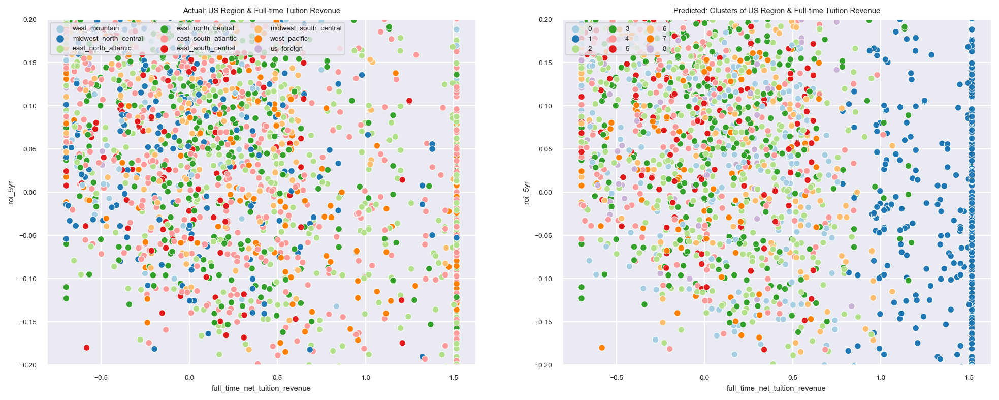

In [113]:
# seeing how month clusters compare against actual month and home age

sns.set(font_scale = 0.6)
plt.subplots(1, 2, figsize = (16, 6), sharex = False, sharey = False)

plt.subplot(121)
sns.scatterplot(
        x = "full_time_net_tuition_revenue",
        y = "roi_5yr",
        data = train_imputed.sample(5000, random_state = 123), 
        hue = "us_region",
        palette = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
)

plt.title("Actual: US Region & Full-time Tuition Revenue")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)

plt.subplot(122)
sns.scatterplot(
        x = "full_time_net_tuition_revenue",
        y = "roi_5yr",
        data = train_scaled.sample(5000, random_state = 123), 
        hue = "region_clusters_5yr",
        palette = ['#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99','#e31a1c','#fdbf6f','#ff7f00','#cab2d6']
)

plt.title("Predicted: Clusters of US Region & Full-time Tuition Revenue")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)
plt.show()

----
### ``Cluster Number 4: Share of First-time, Full-time Students``

In [114]:
# setting features to cluster on 

X_full_time = train_scaled[[
    'avg_faculty_salary',
    'share_entering_ft_binned_below_average',
    'share_entering_ft_binned_average',
    'share_entering_ft_binned_above_average',
    'share_entering_ft_binned_highest_average',
    ]]

# validate df
X_val = validate_scaled[[
    'avg_faculty_salary',
    'share_entering_ft_binned_below_average',
    'share_entering_ft_binned_average',
    'share_entering_ft_binned_above_average',
    'share_entering_ft_binned_highest_average'
    ]]

# test df
X_test = test_scaled[[
    'avg_faculty_salary',
    'share_entering_ft_binned_below_average',
    'share_entering_ft_binned_average',
    'share_entering_ft_binned_above_average',
    'share_entering_ft_binned_highest_average'
    ]]

X_full_time.head()

,avg_faculty_salary,share_entering_ft_binned_below_average,share_entering_ft_binned_average,share_entering_ft_binned_above_average,share_entering_ft_binned_highest_average
25530,0.212325,False,True,False,False
53875,-0.719918,True,False,False,False
42932,-0.060456,True,False,False,False
45495,-0.523949,True,False,False,False
25003,1.159755,False,False,False,True


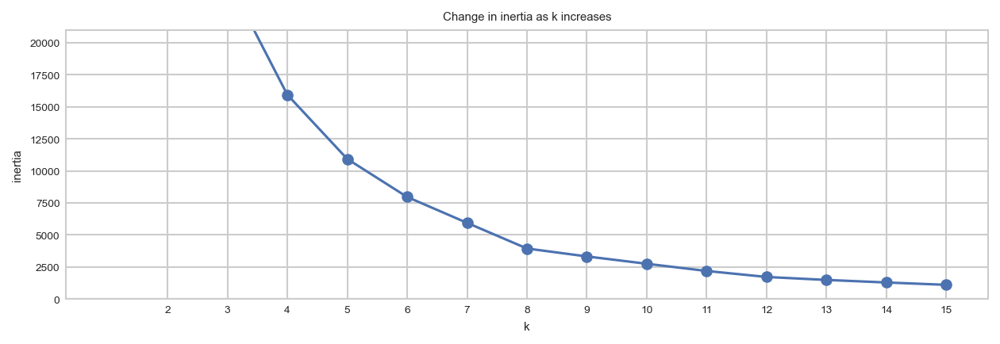

In [115]:
# KMeans Elbow-method

with plt.style.context('seaborn-whitegrid'):

    plt.figure(figsize = (10, 3))
    pd.Series({k: KMeans(k).fit(X_full_time).inertia_ for k in range(1, 16)}).plot(marker = 'o')
    plt.xticks(range(2, 16))
    
    plt.ylim(0, 21000)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

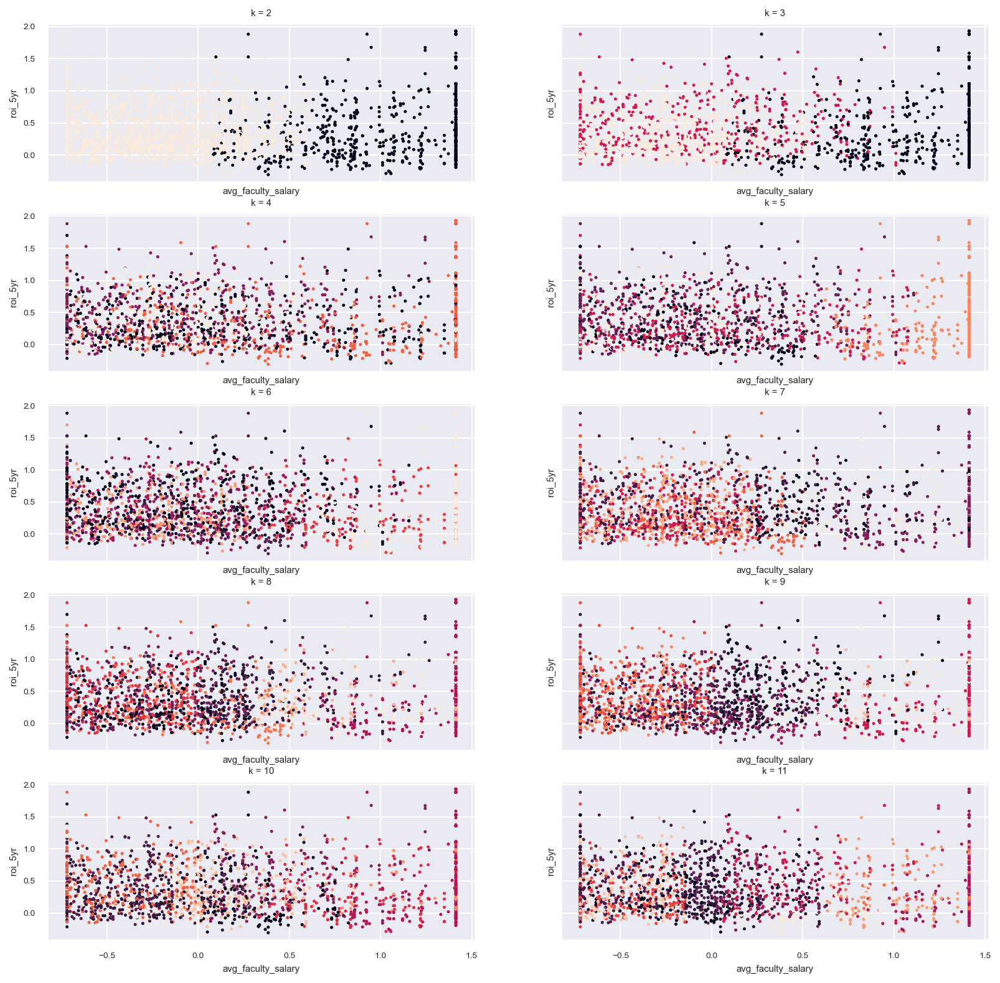

In [116]:
# plotting inertia for number of KMeans clusters

fig, axs = plt.subplots(5, 2, figsize=(13, 13), sharex=True, sharey=True)

for ax, k in zip(axs.ravel(), range(2, 16)):
    
    X4 = X_full_time.sample(2000, random_state = 123)

    # creating and fitting KMeans
    clusters = KMeans(k).fit(X4).predict(X4)

    X4["roi_5yr"] = train_scaled["roi_5yr"]

    ax.scatter(
        X4["avg_faculty_salary"],
        X4["roi_5yr"],
        c = clusters,
        s = 2)

    ax.set(title='k = {}'.format(k), xlabel = 'avg_faculty_salary', ylabel = 'roi_5yr')

In [117]:
ref_coeff = 0

for n_cluster in range(2, 13):

    kmeans = KMeans(n_clusters = n_cluster).fit(X4)

    label = kmeans.labels_

    sil_coeff = silhouette_score(X4, label, metric = 'euclidean')
    rel_coeff = (sil_coeff - ref_coeff)/ref_coeff
    ref_coeff = sil_coeff
    print("For n_clusters = {}, The Relative Silhouette Coefficient is {:.4f} and relative difference of {:.3f}".format(n_cluster, sil_coeff, rel_coeff))

# obtaining the best coefficient results at n_clusters = 5: using sklearn silhouette coefficient method

For n_clusters = 2, The Relative Silhouette Coefficient is 0.2783 and relative difference of inf
For n_clusters = 3, The Relative Silhouette Coefficient is 0.3164 and relative difference of 0.137
For n_clusters = 4, The Relative Silhouette Coefficient is 0.4707 and relative difference of 0.488
For n_clusters = 5, The Relative Silhouette Coefficient is 0.4784 and relative difference of 0.016
For n_clusters = 6, The Relative Silhouette Coefficient is 0.4906 and relative difference of 0.026
For n_clusters = 7, The Relative Silhouette Coefficient is 0.4736 and relative difference of -0.035
For n_clusters = 8, The Relative Silhouette Coefficient is 0.4661 and relative difference of -0.016
For n_clusters = 9, The Relative Silhouette Coefficient is 0.4662 and relative difference of 0.000
For n_clusters = 10, The Relative Silhouette Coefficient is 0.4510 and relative difference of -0.033
For n_clusters = 11, The Relative Silhouette Coefficient is 0.4371 and relative difference of -0.031
For n_

In [118]:
# initial fitting of KMeans cluster

kmeans = KMeans(n_clusters = 6)
kmeans.fit(X_full_time)

train_clusters = kmeans.predict(X_full_time)

In [119]:
# creating cluster for ea. dataset 

train_ft_clusters_5yr = kmeans.predict(X_full_time)
val_ft_clusters_5yr = kmeans.predict(X_val)
test_ft_clusters_5yr = kmeans.predict(X_test)

# viewing cluster samples
pd.DataFrame(train_ft_clusters_5yr).rename(columns = {0: "Cluster Sample"}).sample(10, random_state = 123)

,Cluster Sample
21417,0
28667,4
7477,2
24935,1
24966,0
7142,2
30603,5
7930,1
31203,2
1107,1


In [120]:
# adding clusters back to original datasets

train_scaled["ft_clusters_5yr"] = train_ft_clusters_5yr
validate_scaled["ft_clusters_5yr"] = val_ft_clusters_5yr
test_scaled["ft_clusters_5yr"] = test_ft_clusters_5yr

train_scaled.head()

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,...,admission_rate_binned_average_acceptance,admission_rate_binned_above_average_acceptance,SAT_binned_average_sat,SAT_binned_above_average_sat,SAT_binned_competitive_sat,SAT_binned_very_competitive_sat,admission_clusters_5yr,control_clusters_5yr,region_clusters_5yr,ft_clusters_5yr
25530,0.443437,University of Memphis,TN,38152,Memphis,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,True,False,True,False,False,4,1,7,0
53875,0.402047,Limestone University,SC,29340-3799,Gaffney,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,True,False,False,False,0,2,2,1
42932,0.563267,Texas State University,TX,78666,San Marcos,0.50,0.0,0.0,0.0,Bachelors Degree,...,True,False,False,True,False,False,4,1,5,1
45495,-0.732042,Judson University,IL,60123-1498,Elgin,-0.25,0.0,0.0,0.0,Bachelors Degree,...,True,False,True,False,False,False,3,0,3,1
25003,0.078220,Yeshiva University,NY,10033-3299,New York,-0.50,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,False,True,2,0,0,5


In [121]:
# printing average admissions rate by control cluster

unique_clusters = sorted(train_scaled["ft_clusters_5yr"].unique().tolist())

container = []

for cluster in unique_clusters:
    
    metric = {
    'full-time cluster': cluster,
    'avg faculty salary': round(train_scaled[train_scaled["ft_clusters_5yr"] == cluster]["avg_faculty_salary"].mean(), 3),
    'min 5YR ROI': round(train_scaled[train_scaled["ft_clusters_5yr"] == cluster]["roi_5yr"].min(), 3),
    'max 5YR ROI': round(train_scaled[train_scaled["ft_clusters_5yr"] == cluster]["roi_5yr"].max(), 3),
    'range of 5YR ROI': round((train_scaled[train_scaled["ft_clusters_5yr"] == cluster]["roi_5yr"].max() - train_scaled[train_scaled["ft_clusters_5yr"] == cluster]["roi_5yr"].min()), 2),
    'average 5YR ROI': round(train_scaled[train_scaled["ft_clusters_5yr"] == cluster]["roi_5yr"].mean(), 3)
    }

    container.append(metric)

cluster_description = pd.DataFrame(container).sort_values(by = "average 5YR ROI", ascending = False).reset_index(drop = True)
cluster_description

,full-time cluster,avg faculty salary,min 5YR ROI,max 5YR ROI,range of 5YR ROI,average 5YR ROI
0,5,1.274,-0.382,2.103,2.49,0.556
1,1,-0.113,-0.322,1.969,2.29,0.457
2,0,-0.090,-0.385,1.696,2.08,0.381
3,2,-0.306,-0.319,1.700,2.02,0.319
4,3,0.877,-0.364,1.528,1.89,0.300
5,4,-0.099,-0.363,2.103,2.47,0.299


----
### ``Cluster Number 5: College Majors``

In [122]:
# setting features to cluster on 

X_majors = train_scaled[[
    'share_of_part_time',
    'major_category_Agriculture',
    'major_category_Architecture',
    'major_category_Area, Ethnic, and Civilization Studies',
    'major_category_Biology and Life Sciences',
    'major_category_Business',
    'major_category_Communication Technologies',
    'major_category_Communications',
    'major_category_Computer and Information Sciences',
    'major_category_Construction Services',
    'major_category_Cosmetology Services and Culinary Arts',
    'major_category_Criminal Justice and Fire Protection',
    'major_category_Education Administration and Teaching',
    'major_category_Electrical and Mechanic Repairs and Technologies',
    'major_category_Engineering',
    'major_category_Engineering Technologies',
    'major_category_English Language, Literature, and Composition',
    'major_category_Environment and Natural Resources',
    'major_category_Family and Consumer Sciences',
    'major_category_Fine Arts',
    'major_category_History',
    'major_category_Interdisciplinary and Multi-Disciplinary Studies (General)',
    'major_category_Law',
    'major_category_Liberal Arts and Humanities',
    'major_category_Library Science',
    'major_category_Linguistics and Foreign Languages',
    'major_category_Mathematics and Statistics',
    'major_category_Medical and Health Sciences and Services',
    'major_category_Military Technologies',
    'major_category_Nuclear, Industrial Radiology, and Biological Technologies',
    'major_category_Philosophy and Religious Studies',
    'major_category_Physical Fitness, Parks, Recreation, and Leisure',
    'major_category_Physical Sciences',
    'major_category_Psychology',
    'major_category_Public Affairs, Policy, and Social Work',
    'major_category_Social Sciences',
    'major_category_Theology and Religious Vocations',
    'major_category_Transportation Sciences and Technologies'
    ]]

# validate df
X_val = validate_scaled[[
    'share_of_part_time',
    'major_category_Agriculture',
    'major_category_Architecture',
    'major_category_Area, Ethnic, and Civilization Studies',
    'major_category_Biology and Life Sciences',
    'major_category_Business',
    'major_category_Communication Technologies',
    'major_category_Communications',
    'major_category_Computer and Information Sciences',
    'major_category_Construction Services',
    'major_category_Cosmetology Services and Culinary Arts',
    'major_category_Criminal Justice and Fire Protection',
    'major_category_Education Administration and Teaching',
    'major_category_Electrical and Mechanic Repairs and Technologies',
    'major_category_Engineering',
    'major_category_Engineering Technologies',
    'major_category_English Language, Literature, and Composition',
    'major_category_Environment and Natural Resources',
    'major_category_Family and Consumer Sciences',
    'major_category_Fine Arts',
    'major_category_History',
    'major_category_Interdisciplinary and Multi-Disciplinary Studies (General)',
    'major_category_Law',
    'major_category_Liberal Arts and Humanities',
    'major_category_Library Science',
    'major_category_Linguistics and Foreign Languages',
    'major_category_Mathematics and Statistics',
    'major_category_Medical and Health Sciences and Services',
    'major_category_Military Technologies',
    'major_category_Nuclear, Industrial Radiology, and Biological Technologies',
    'major_category_Philosophy and Religious Studies',
    'major_category_Physical Fitness, Parks, Recreation, and Leisure',
    'major_category_Physical Sciences',
    'major_category_Psychology',
    'major_category_Public Affairs, Policy, and Social Work',
    'major_category_Social Sciences',
    'major_category_Theology and Religious Vocations',
    'major_category_Transportation Sciences and Technologies'
    ]]

# test df
X_test = test_scaled[[
    'share_of_part_time',
    'major_category_Agriculture',
    'major_category_Architecture',
    'major_category_Area, Ethnic, and Civilization Studies',
    'major_category_Biology and Life Sciences',
    'major_category_Business',
    'major_category_Communication Technologies',
    'major_category_Communications',
    'major_category_Computer and Information Sciences',
    'major_category_Construction Services',
    'major_category_Cosmetology Services and Culinary Arts',
    'major_category_Criminal Justice and Fire Protection',
    'major_category_Education Administration and Teaching',
    'major_category_Electrical and Mechanic Repairs and Technologies',
    'major_category_Engineering',
    'major_category_Engineering Technologies',
    'major_category_English Language, Literature, and Composition',
    'major_category_Environment and Natural Resources',
    'major_category_Family and Consumer Sciences',
    'major_category_Fine Arts',
    'major_category_History',
    'major_category_Interdisciplinary and Multi-Disciplinary Studies (General)',
    'major_category_Law',
    'major_category_Liberal Arts and Humanities',
    'major_category_Library Science',
    'major_category_Linguistics and Foreign Languages',
    'major_category_Mathematics and Statistics',
    'major_category_Medical and Health Sciences and Services',
    'major_category_Military Technologies',
    'major_category_Nuclear, Industrial Radiology, and Biological Technologies',
    'major_category_Philosophy and Religious Studies',
    'major_category_Physical Fitness, Parks, Recreation, and Leisure',
    'major_category_Physical Sciences',
    'major_category_Psychology',
    'major_category_Public Affairs, Policy, and Social Work',
    'major_category_Social Sciences',
    'major_category_Theology and Religious Vocations',
    'major_category_Transportation Sciences and Technologies'
    ]]

X_majors.head()

,share_of_part_time,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,...,major_category_Military Technologies,"major_category_Nuclear, Industrial Radiology, and Biological Technologies",major_category_Philosophy and Religious Studies,"major_category_Physical Fitness, Parks, Recreation, and Leisure",major_category_Physical Sciences,major_category_Psychology,"major_category_Public Affairs, Policy, and Social Work",major_category_Social Sciences,major_category_Theology and Religious Vocations,major_category_Transportation Sciences and Technologies
25530,0.820877,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
53875,0.723286,False,False,False,False,False,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
42932,0.526251,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
45495,1.419395,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
25003,-0.470661,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


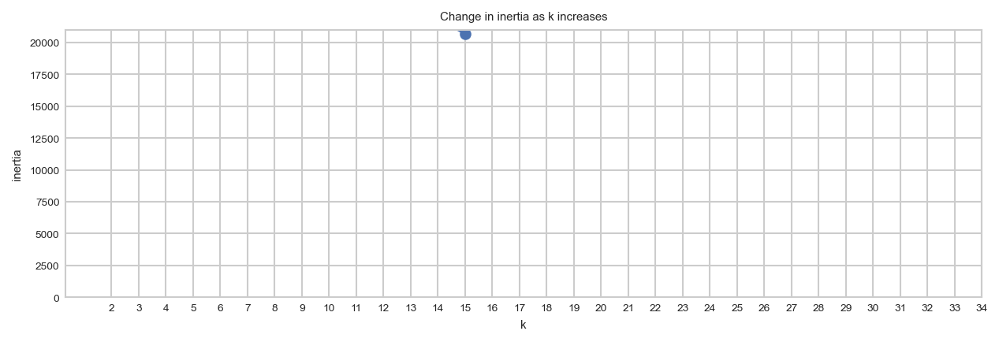

In [123]:
# KMeans Elbow-method

with plt.style.context('seaborn-whitegrid'):

    plt.figure(figsize = (10, 3))
    pd.Series({k: KMeans(k).fit(X_majors).inertia_ for k in range(1, 16)}).plot(marker = 'o')
    plt.xticks(range(2, 35))
    
    plt.ylim(0, 21000)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

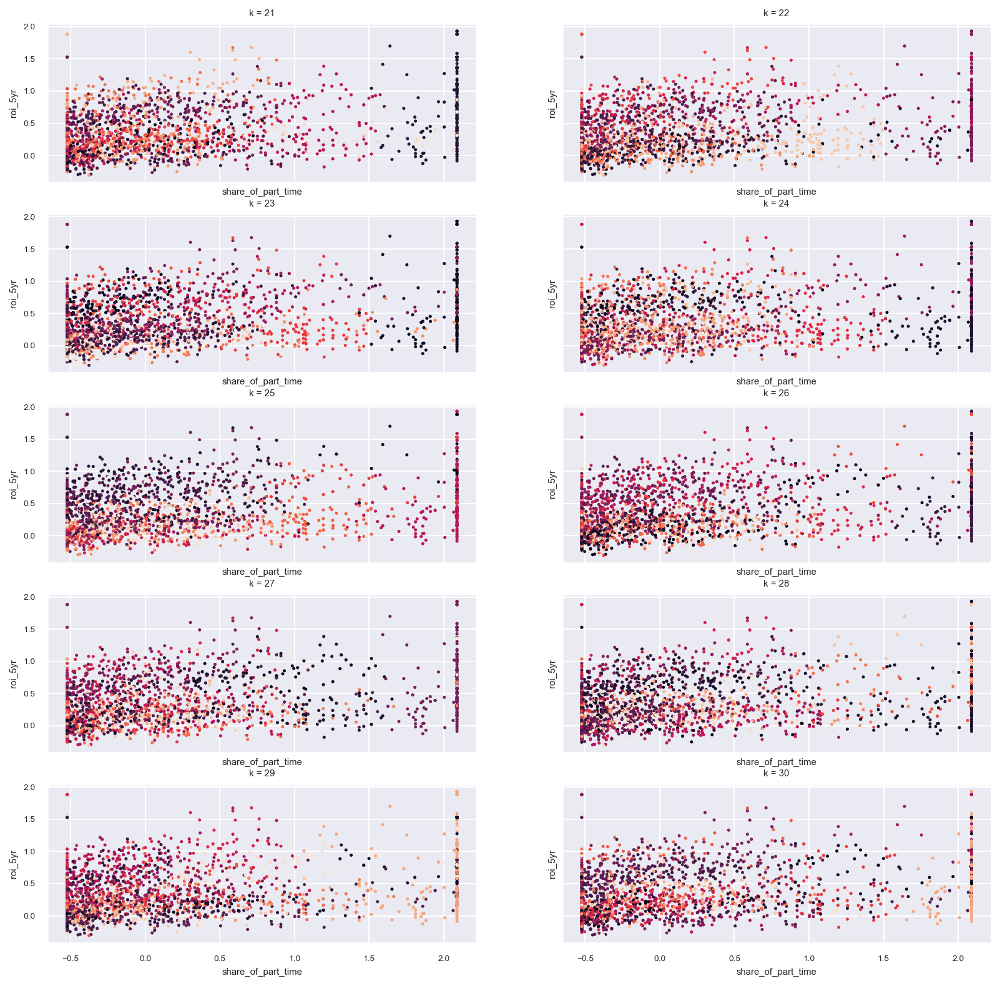

In [124]:
# plotting inertia for number of KMeans clusters

fig, axs = plt.subplots(5, 2, figsize=(13, 13), sharex=True, sharey=True)

for ax, k in zip(axs.ravel(), range(21, 31)):
    
    X5 = X_majors.sample(2000, random_state = 123)

    # creating and fitting KMeans
    clusters = KMeans(k).fit(X5).predict(X5)

    X5["roi_5yr"] = train_scaled["roi_5yr"]

    ax.scatter(
        X5["share_of_part_time"],
        X5["roi_5yr"],
        c = clusters,
        s = 2)

    ax.set(title='k = {}'.format(k), xlabel = 'share_of_part_time', ylabel = 'roi_5yr')

In [125]:
ref_coeff = 0

for n_cluster in range(2, 38):

    kmeans = KMeans(n_clusters = n_cluster).fit(X5)

    label = kmeans.labels_

    sil_coeff = silhouette_score(X5, label, metric = 'euclidean')
    rel_coeff = (sil_coeff - ref_coeff)/ref_coeff
    ref_coeff = sil_coeff
    print("For n_clusters = {}, The Relative Silhouette Coefficient is {:.4f} and relative difference of {:.3f}".format(n_cluster, sil_coeff, rel_coeff))

For n_clusters = 2, The Relative Silhouette Coefficient is 0.3283 and relative difference of inf
For n_clusters = 3, The Relative Silhouette Coefficient is 0.1489 and relative difference of -0.547
For n_clusters = 4, The Relative Silhouette Coefficient is 0.1601 and relative difference of 0.076
For n_clusters = 5, The Relative Silhouette Coefficient is 0.1624 and relative difference of 0.014
For n_clusters = 6, The Relative Silhouette Coefficient is 0.2031 and relative difference of 0.250
For n_clusters = 7, The Relative Silhouette Coefficient is 0.2351 and relative difference of 0.158
For n_clusters = 8, The Relative Silhouette Coefficient is 0.2593 and relative difference of 0.103
For n_clusters = 9, The Relative Silhouette Coefficient is 0.2936 and relative difference of 0.132
For n_clusters = 10, The Relative Silhouette Coefficient is 0.3218 and relative difference of 0.096
For n_clusters = 11, The Relative Silhouette Coefficient is 0.3159 and relative difference of -0.018
For n_cl

In [126]:
# fitting of KMeans cluster

kmeans = KMeans(n_clusters = 30)
kmeans.fit(X_majors)

train_clusters = kmeans.predict(X_majors)

In [127]:
# creating cluster for ea. dataset 

train_majors_clusters_5yr = kmeans.predict(X_majors)
val_majors_clusters_5yr = kmeans.predict(X_val)
test_majors_clusters_5yr = kmeans.predict(X_test)

# viewing cluster samples
pd.DataFrame(train_majors_clusters_5yr).rename(columns = {0: "Cluster Sample"}).sample(10, random_state = 123)

,Cluster Sample
21417,0
28667,3
7477,6
24935,27
24966,18
7142,3
30603,25
7930,12
31203,13
1107,5


In [128]:
# adding clusters back to original datasets

train_scaled["major_clusters_5yr"] = train_majors_clusters_5yr
validate_scaled["major_clusters_5yr"] = val_majors_clusters_5yr
test_scaled["major_clusters_5yr"] = test_majors_clusters_5yr

train_scaled.head()

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,...,admission_rate_binned_above_average_acceptance,SAT_binned_average_sat,SAT_binned_above_average_sat,SAT_binned_competitive_sat,SAT_binned_very_competitive_sat,admission_clusters_5yr,control_clusters_5yr,region_clusters_5yr,ft_clusters_5yr,major_clusters_5yr
25530,0.443437,University of Memphis,TN,38152,Memphis,0.25,0.0,0.0,0.0,Bachelors Degree,...,True,False,True,False,False,4,1,7,0,18
53875,0.402047,Limestone University,SC,29340-3799,Gaffney,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,True,False,False,False,0,2,2,1,21
42932,0.563267,Texas State University,TX,78666,San Marcos,0.50,0.0,0.0,0.0,Bachelors Degree,...,False,False,True,False,False,4,1,5,1,3
45495,-0.732042,Judson University,IL,60123-1498,Elgin,-0.25,0.0,0.0,0.0,Bachelors Degree,...,False,True,False,False,False,3,0,3,1,12
25003,0.078220,Yeshiva University,NY,10033-3299,New York,-0.50,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,True,2,0,0,5,18


In [129]:
# printing average admissions rate by control cluster

unique_clusters = sorted(train_scaled["major_clusters_5yr"].unique().tolist())

container = []

for cluster in unique_clusters:
    
    metric = {
    'major cluster': cluster,
    'share of part-time students': round(train_scaled[train_scaled["major_clusters_5yr"] == cluster]["share_of_part_time"].mean(), 3),
    'min 5YR ROI': round(train_scaled[train_scaled["major_clusters_5yr"] == cluster]["roi_5yr"].min(), 3),
    'max 5YR ROI': round(train_scaled[train_scaled["major_clusters_5yr"] == cluster]["roi_5yr"].max(), 3),
    'range of 5YR ROI': round((train_scaled[train_scaled["major_clusters_5yr"] == cluster]["roi_5yr"].max() - train_scaled[train_scaled["major_clusters_5yr"] == cluster]["roi_5yr"].min()), 2),
    'average 5YR ROI': round(train_scaled[train_scaled["major_clusters_5yr"] == cluster]["roi_5yr"].mean(), 3)
    }

    container.append(metric)

cluster_description = pd.DataFrame(container).sort_values(by = "average 5YR ROI", ascending = False).reset_index(drop = True)
cluster_description

,major cluster,share of part-time students,min 5YR ROI,max 5YR ROI,range of 5YR ROI,average 5YR ROI
0,12,1.951,0.244,1.604,1.36,1.099
1,9,-0.079,0.405,1.930,1.52,0.982
2,8,-0.057,0.287,1.883,1.60,0.962
3,24,0.594,0.129,1.529,1.40,0.800
4,20,0.630,0.149,1.358,1.21,0.713
5,0,2.042,-0.322,2.103,2.43,0.694
6,2,-0.252,0.084,1.529,1.44,0.668
7,16,-0.137,0.191,1.484,1.29,0.646
8,7,-0.284,0.113,1.358,1.24,0.536
9,19,1.724,-0.082,0.866,0.95,0.469


----
### ``Cluster Number 6: SAT Score Clusters``

In [130]:
# setting features to cluster on 

X_sat = train_scaled[[
    'undergraduate_number_pell_grant_fedral_loan',
    'SAT_binned_average_sat',
    'SAT_binned_above_average_sat',	
    'SAT_binned_competitive_sat',	
    'SAT_binned_very_competitive_sat'
    ]]

# validate df
X_val = validate_scaled[[
    'undergraduate_number_pell_grant_fedral_loan',
    'SAT_binned_average_sat',
    'SAT_binned_above_average_sat',	
    'SAT_binned_competitive_sat',	
    'SAT_binned_very_competitive_sat'    
    ]]

# test df
X_test = test_scaled[[
    'undergraduate_number_pell_grant_fedral_loan',
    'SAT_binned_average_sat',
    'SAT_binned_above_average_sat',	
    'SAT_binned_competitive_sat',	
    'SAT_binned_very_competitive_sat'    
    ]]

X_sat.head()

,undergraduate_number_pell_grant_fedral_loan,SAT_binned_average_sat,SAT_binned_above_average_sat,SAT_binned_competitive_sat,SAT_binned_very_competitive_sat
25530,1.270727,False,True,False,False
53875,-0.109832,True,False,False,False
42932,2.369975,False,True,False,False
45495,-0.250487,True,False,False,False
25003,-0.101755,False,False,False,True


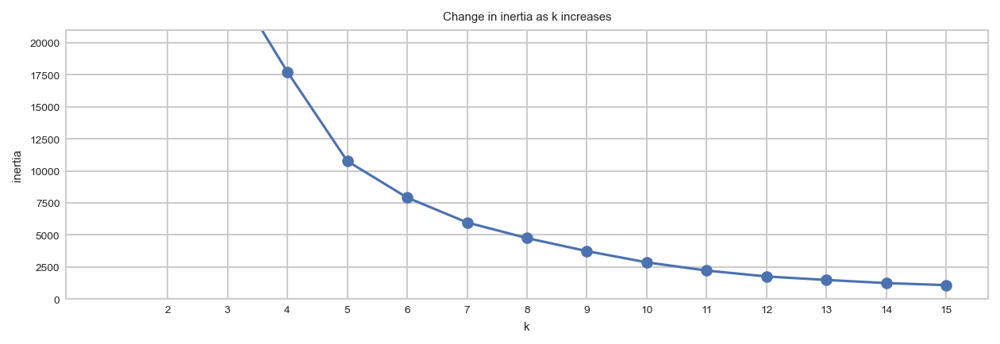

In [131]:
# KMeans Elbow-method

with plt.style.context('seaborn-whitegrid'):

    plt.figure(figsize = (10, 3))
    pd.Series({k: KMeans(k).fit(X_sat).inertia_ for k in range(1, 16)}).plot(marker = 'o')
    plt.xticks(range(2, 16))
    
    plt.ylim(0, 21000)
    plt.xlabel('k')
    plt.ylabel('inertia')
    plt.title('Change in inertia as k increases')

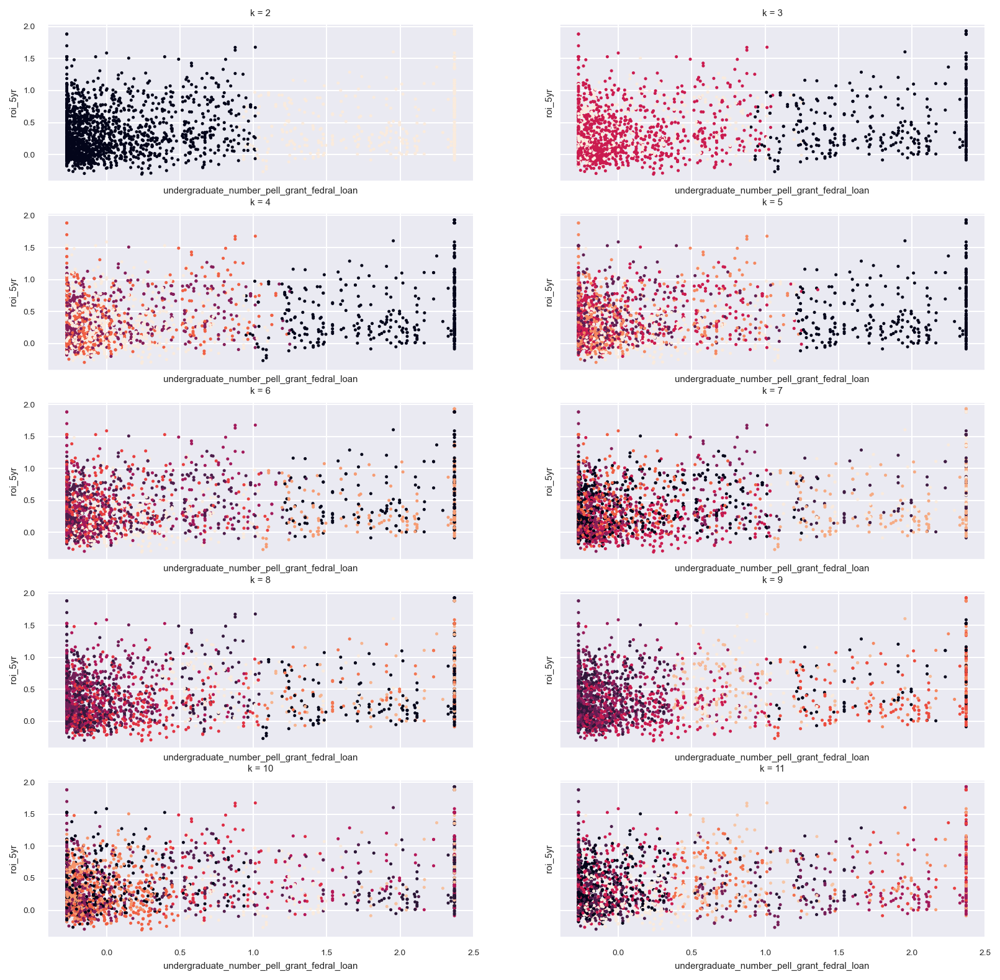

In [132]:
# plotting inertia for number of KMeans clusters

fig, axs = plt.subplots(5, 2, figsize=(13, 13), sharex=True, sharey=True)

for ax, k in zip(axs.ravel(), range(2, 16)):
    
    X6 = X_sat.sample(2000, random_state = 123)

    # creating and fitting KMeans
    clusters = KMeans(k).fit(X6).predict(X6)

    X6["roi_5yr"] = train_scaled["roi_5yr"]

    ax.scatter(
        X6["undergraduate_number_pell_grant_fedral_loan"],
        X6["roi_5yr"],
        c = clusters,
        s = 2)

    ax.set(title='k = {}'.format(k), xlabel = 'undergraduate_number_pell_grant_fedral_loan', ylabel = 'roi_5yr')

In [133]:
ref_coeff = 0

for n_cluster in range(2, 13):

    kmeans = KMeans(n_clusters = n_cluster).fit(X6)

    label = kmeans.labels_

    sil_coeff = silhouette_score(X6, label, metric = 'euclidean')
    rel_coeff = (sil_coeff - ref_coeff)/ref_coeff
    ref_coeff = sil_coeff
    print("For n_clusters = {}, The Relative Silhouette Coefficient is {:.4f} and relative difference of {:.3f}".format(n_cluster, sil_coeff, rel_coeff))

# obtaining the best coefficient results at n_clusters = 5: using sklearn silhouette coefficient method

For n_clusters = 2, The Relative Silhouette Coefficient is 0.4237 and relative difference of inf
For n_clusters = 3, The Relative Silhouette Coefficient is 0.3468 and relative difference of -0.182
For n_clusters = 4, The Relative Silhouette Coefficient is 0.4554 and relative difference of 0.313
For n_clusters = 5, The Relative Silhouette Coefficient is 0.5478 and relative difference of 0.203
For n_clusters = 6, The Relative Silhouette Coefficient is 0.5534 and relative difference of 0.010
For n_clusters = 7, The Relative Silhouette Coefficient is 0.5727 and relative difference of 0.035
For n_clusters = 8, The Relative Silhouette Coefficient is 0.5532 and relative difference of -0.034
For n_clusters = 9, The Relative Silhouette Coefficient is 0.5446 and relative difference of -0.016
For n_clusters = 10, The Relative Silhouette Coefficient is 0.5320 and relative difference of -0.023
For n_clusters = 11, The Relative Silhouette Coefficient is 0.4989 and relative difference of -0.062
For n

In [134]:
# fitting of KMeans cluster

kmeans = KMeans(n_clusters = 4)
kmeans.fit(X_sat)

train_clusters = kmeans.predict(X_sat)

In [135]:
# creating cluster for ea. dataset 

train_sat_clusters_5yr = kmeans.predict(X_sat)
val_sat_clusters_5yr = kmeans.predict(X_val)
test_sat_clusters_5yr = kmeans.predict(X_test)

# viewing cluster samples
pd.DataFrame(train_sat_clusters_5yr).rename(columns = {0: "Cluster Sample"}).sample(10, random_state = 123)

,Cluster Sample
21417,1
28667,3
7477,1
24935,2
24966,2
7142,2
30603,1
7930,3
31203,3
1107,2


In [136]:
# adding clusters back to original datasets

train_scaled["sat_clusters_5yr"] = train_sat_clusters_5yr
validate_scaled["sat_clusters_5yr"] = val_sat_clusters_5yr
test_scaled["sat_clusters_5yr"] = test_sat_clusters_5yr

train_scaled.head()

,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,...,SAT_binned_average_sat,SAT_binned_above_average_sat,SAT_binned_competitive_sat,SAT_binned_very_competitive_sat,admission_clusters_5yr,control_clusters_5yr,region_clusters_5yr,ft_clusters_5yr,major_clusters_5yr,sat_clusters_5yr
25530,0.443437,University of Memphis,TN,38152,Memphis,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,True,False,False,4,1,7,0,18,0
53875,0.402047,Limestone University,SC,29340-3799,Gaffney,0.25,0.0,0.0,0.0,Bachelors Degree,...,True,False,False,False,0,2,2,1,21,2
42932,0.563267,Texas State University,TX,78666,San Marcos,0.50,0.0,0.0,0.0,Bachelors Degree,...,False,True,False,False,4,1,5,1,3,0
45495,-0.732042,Judson University,IL,60123-1498,Elgin,-0.25,0.0,0.0,0.0,Bachelors Degree,...,True,False,False,False,3,0,3,1,12,2
25003,0.078220,Yeshiva University,NY,10033-3299,New York,-0.50,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,True,2,0,0,5,18,1


In [137]:
# printing undergraduate pell grant loan rate by admitted SAT

unique_clusters = sorted(train_scaled["sat_clusters_5yr"].unique().tolist())

container = []

for cluster in unique_clusters:
    
    metric = {
    'major cluster': cluster,
    'undergrad federal loan': round(train_scaled[train_scaled["sat_clusters_5yr"] == cluster]["undergraduate_number_pell_grant_fedral_loan"].mean(), 3),
    'min 5YR ROI': round(train_scaled[train_scaled["sat_clusters_5yr"] == cluster]["roi_5yr"].min(), 3),
    'max 5YR ROI': round(train_scaled[train_scaled["sat_clusters_5yr"] == cluster]["roi_5yr"].max(), 3),
    'range of 5YR ROI': round((train_scaled[train_scaled["sat_clusters_5yr"] == cluster]["roi_5yr"].max() - train_scaled[train_scaled["sat_clusters_5yr"] == cluster]["roi_5yr"].min()), 2),
    'average 5YR ROI': round(train_scaled[train_scaled["sat_clusters_5yr"] == cluster]["roi_5yr"].mean(), 3)
    }

    container.append(metric)

cluster_description = pd.DataFrame(container).sort_values(by = "average 5YR ROI", ascending = False).reset_index(drop = True)
cluster_description

,major cluster,undergrad federal loan,min 5YR ROI,max 5YR ROI,range of 5YR ROI,average 5YR ROI
0,0,1.979,-0.339,2.103,2.44,0.566
1,3,-0.036,-0.385,2.103,2.49,0.394
2,2,0.043,-0.295,1.787,2.08,0.372
3,1,0.064,-0.382,1.969,2.35,0.309


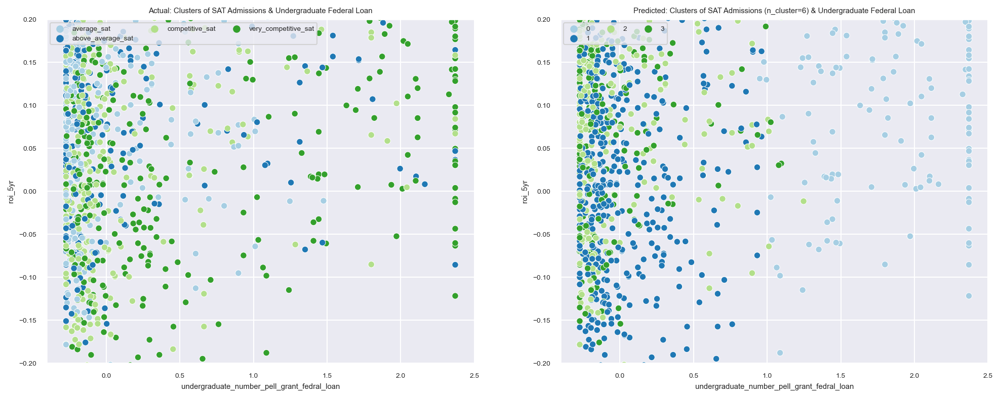

In [138]:
# seeing how month clusters compare against actual month and home age

sns.set(font_scale = 0.6)
plt.subplots(1, 2, figsize = (16, 6), sharex = False, sharey = False)

plt.subplot(121)
sns.scatterplot(
        x = "undergraduate_number_pell_grant_fedral_loan",
        y = "roi_5yr",
        data = train_imputed.sample(2500, random_state = 123), 
        hue = "SAT_binned",
        palette = ['#a6cee3','#1f78b4','#b2df8a','#33a02c']
)

plt.title("Actual: Clusters of SAT Admissions & Undergraduate Federal Loan")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)

plt.subplot(122)
sns.scatterplot(
        x = "undergraduate_number_pell_grant_fedral_loan",
        y = "roi_5yr",
        data = train_scaled.sample(2500, random_state = 123), 
        hue = "sat_clusters_5yr",
        palette = ['#a6cee3','#1f78b4','#b2df8a','#33a02c']
)

plt.title("Predicted: Clusters of SAT Admissions (n_cluster=6) & Undergraduate Federal Loan")
plt.legend(loc = 'upper left', ncol = 3)
plt.ylim(-.2, .2)
plt.show()

----
### ``Modeling Pre-processing``


In [139]:
# creating dummy dataframes with generated clusters for modeling

train_model, validate_model, test_model = prepare.get_cluster_dummy(train_scaled, validate_scaled, test_scaled)
print(f'dataframe shape: {train_model.shape}')
train_model.head()

dataframe shape: (39995, 230)


,unit_id_institution,college_name,state_post_code,zip_code,city,region_ipeds,title_IV_eligibility,pred_degree,pred_degree_0and4,degree_name,...,major_clusters_5yr_24,major_clusters_5yr_25,major_clusters_5yr_26,major_clusters_5yr_27,major_clusters_5yr_28,major_clusters_5yr_29,sat_clusters_5yr_0,sat_clusters_5yr_1,sat_clusters_5yr_2,sat_clusters_5yr_3
25530,0.443437,University of Memphis,TN,38152,Memphis,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,False,False,True,False,False,False
53875,0.402047,Limestone University,SC,29340-3799,Gaffney,0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,False,False,False,False,True,False
42932,0.563267,Texas State University,TX,78666,San Marcos,0.50,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,False,False,True,False,False,False
45495,-0.732042,Judson University,IL,60123-1498,Elgin,-0.25,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,False,False,False,False,True,False
25003,0.078220,Yeshiva University,NY,10033-3299,New York,-0.50,0.0,0.0,0.0,Bachelors Degree,...,False,False,False,False,False,False,False,True,False,False


----
### ``Establishing a Model Baseline for Comparison``

In [140]:
# get 5YR ROI predictive baseline for training and validate datasets

train_model, validate_model = prepare.establish_baseline(train_model, validate_model)

Train baseline RMSE: 0.41
Validate baseline RMSE: 0.41

train shape: (39995, 230)
validate shape: (17142, 230)


In [141]:
# create copies 
train_model_actual = train_model.copy()
validate_model_actual = validate_model.copy()

### ``RFECV all features: exclusive of target variables``

In [142]:
# training dataset

X_train = train_model[[
    'unit_id_institution',
    # 'college_name',
    # 'state_post_code',
    # 'zip_code',
    # 'city',
    'region_ipeds',
    'title_IV_eligibility',
    'pred_degree',
    'pred_degree_0and4',
    # 'degree_name',
    'degree_code',
    'major_code',
    # 'major_name',
    'branch_number',
    'avg_net_price_public',
    'avg_net_price_private',
    'full_time_net_tuition_revenue',
    'off_campus_cost_of_attendace',
    'on_campus_cost_of_attendace',
    'admission_rate',
    'graduate_number',
    'ACT_score_mid',
    'avg_sat_admitted',
    'required_score',
    'avg_faculty_salary',
    'online_only',
    'comp_rt_ft_150over_expected_time',
    'comp_rt_ft_150over_expected_time_two_races',
    'comp_rt_ft_150over_expected_time_native_american',
    'comp_rt_ft_150over_expected_time_asian',
    'comp_rt_ft_150over_expected_time_black',
    'comp_rt_ft_150over_expected_time_hispanic',
    'comp_rt_ft_150over_expected_time_non_resident',
    'comp_rt_ft_150over_expected_time_unknown_race',
    'comp_rt_ft_150over_expected_time_white',
    'share_entering_students_first_ft',
    'share_of_part_time',
    'first_time_ft_student_retention',
    'first_time_pt_student_retention',
    'enrollment_share_two_races',
    'enrollment_share_native_american',
    'enrollment_share_asian',
    'enrollment_share_black',
    'enrollment_share_hispanic',
    'enrollment_share_pac_islander',
    'enrollment_share_non_resident',
    'enrollment_share_unknown',
    'enrollment_share_white',
    'undergraduate_number_pell_grant_fedral_loan',
    'med_debt_pell_students',
    'median_debt_completed',
    # 'median_debt_non_first_generation',
    'median_debt_non_pell',
    'fedral_loan_full_time_first_time_undergraduate',
    'pell_grant_full_time_first_time_undergraduate',
    'deg_percent_awarded_agriculture_operations',
    'deg_percent_awarded_natural_resources',
    'deg_percent_awarded_architecture',
    'deg_percent_awarded_area_ethnic_cultural_gender',
    'deg_percent_awarded_communication_journalism',
    'deg_percent_awarded_communication_tech',
    'deg_percent_awarded_computer_science',
    'deg_percent_awarded_personal_culinary_services',
    'deg_percent_awarded_education',
    'deg_percent_awarded_engineering',
    'deg_percent_awarded_engineering_tech',
    'deg_percent_awarded_foreign_language_literatures',
    'deg_percent_awarded_human_science',
    'deg_percent_awarded_legal_profession',
    'deg_percent_awarded_english_lang',
    'deg_percent_awarded_general_studies',
    'deg_percent_awarded_library_sciences',
    'deg_percent_awarded_bio_sciences',
    'deg_percent_awarded_mathematics',
    'deg_percent_awarded_military_tech',
    'deg_percent_awarded_intedisciplinary_studies',
    'deg_percent_awarded_leisure_fitness',
    'deg_percent_awarded_philosophy',
    'deg_percent_awarded_theology',
    'deg_percent_awarded_physical_sciences',
    'deg_percent_awarded_science_tech',
    'deg_percent_awarded_psychology',
    'deg_percent_awarded_homeland_security',
    'deg_percent_awarded_public_admin',
    'deg_percent_awarded_social_sciences',
    'deg_percent_awarded_construction_trades',
    'deg_percent_awarded_mechanic_repair',
    'deg_percent_awarded_precision_production',
    'deg_percent_awarded_transportation_materials',
    'deg_percent_awarded_visual_and_performing_arts',
    'deg_percent_awarded_health',
    'deg_percent_awarded_business_management',
    'deg_percent_awarded_history',
    'non_deg_seeking',
    'income_0_30000',
    'income_30001_48000',
    'income_48001_75000',
    'income_75001_110000',
    'income_over_110000']]

y_train = train_model["roi_5yr"]

# validate dataset
X_validate = validate_model[[
    'unit_id_institution',
    # 'college_name',
    # 'state_post_code',
    # 'zip_code',
    # 'city',
    'region_ipeds',
    'title_IV_eligibility',
    'pred_degree',
    'pred_degree_0and4',
    # 'degree_name',
    'degree_code',
    'major_code',
    # 'major_name',
    'branch_number',
    'avg_net_price_public',
    'avg_net_price_private',
    'full_time_net_tuition_revenue',
    'off_campus_cost_of_attendace',
    'on_campus_cost_of_attendace',
    'admission_rate',
    'graduate_number',
    'ACT_score_mid',
    'avg_sat_admitted',
    'required_score',
    'avg_faculty_salary',
    'online_only',
    'comp_rt_ft_150over_expected_time',
    'comp_rt_ft_150over_expected_time_two_races',
    'comp_rt_ft_150over_expected_time_native_american',
    'comp_rt_ft_150over_expected_time_asian',
    'comp_rt_ft_150over_expected_time_black',
    'comp_rt_ft_150over_expected_time_hispanic',
    'comp_rt_ft_150over_expected_time_non_resident',
    'comp_rt_ft_150over_expected_time_unknown_race',
    'comp_rt_ft_150over_expected_time_white',
    'share_entering_students_first_ft',
    'share_of_part_time',
    'first_time_ft_student_retention',
    'first_time_pt_student_retention',
    'enrollment_share_two_races',
    'enrollment_share_native_american',
    'enrollment_share_asian',
    'enrollment_share_black',
    'enrollment_share_hispanic',
    'enrollment_share_pac_islander',
    'enrollment_share_non_resident',
    'enrollment_share_unknown',
    'enrollment_share_white',
    'undergraduate_number_pell_grant_fedral_loan',
    'med_debt_pell_students',
    'median_debt_completed',
    # 'median_debt_non_first_generation',
    'median_debt_non_pell',
    'fedral_loan_full_time_first_time_undergraduate',
    'pell_grant_full_time_first_time_undergraduate',
    'deg_percent_awarded_agriculture_operations',
    'deg_percent_awarded_natural_resources',
    'deg_percent_awarded_architecture',
    'deg_percent_awarded_area_ethnic_cultural_gender',
    'deg_percent_awarded_communication_journalism',
    'deg_percent_awarded_communication_tech',
    'deg_percent_awarded_computer_science',
    'deg_percent_awarded_personal_culinary_services',
    'deg_percent_awarded_education',
    'deg_percent_awarded_engineering',
    'deg_percent_awarded_engineering_tech',
    'deg_percent_awarded_foreign_language_literatures',
    'deg_percent_awarded_human_science',
    'deg_percent_awarded_legal_profession',
    'deg_percent_awarded_english_lang',
    'deg_percent_awarded_general_studies',
    'deg_percent_awarded_library_sciences',
    'deg_percent_awarded_bio_sciences',
    'deg_percent_awarded_mathematics',
    'deg_percent_awarded_military_tech',
    'deg_percent_awarded_intedisciplinary_studies',
    'deg_percent_awarded_leisure_fitness',
    'deg_percent_awarded_philosophy',
    'deg_percent_awarded_theology',
    'deg_percent_awarded_physical_sciences',
    'deg_percent_awarded_science_tech',
    'deg_percent_awarded_psychology',
    'deg_percent_awarded_homeland_security',
    'deg_percent_awarded_public_admin',
    'deg_percent_awarded_social_sciences',
    'deg_percent_awarded_construction_trades',
    'deg_percent_awarded_mechanic_repair',
    'deg_percent_awarded_precision_production',
    'deg_percent_awarded_transportation_materials',
    'deg_percent_awarded_visual_and_performing_arts',
    'deg_percent_awarded_health',
    'deg_percent_awarded_business_management',
    'deg_percent_awarded_history',
    'non_deg_seeking',
    'income_0_30000',
    'income_30001_48000',
    'income_48001_75000',
    'income_75001_110000',
    'income_over_110000']]

y_validate = validate_model["roi_5yr"]


# test dataset
X_test = test_model[[
    'unit_id_institution',
    # 'college_name',
    # 'state_post_code',
    # 'zip_code',
    # 'city',
    'region_ipeds',
    'title_IV_eligibility',
    'pred_degree',
    'pred_degree_0and4',
    # 'degree_name',
    'degree_code',
    'major_code',
    # 'major_name',
    'branch_number',
    'avg_net_price_public',
    'avg_net_price_private',
    'full_time_net_tuition_revenue',
    'off_campus_cost_of_attendace',
    'on_campus_cost_of_attendace',
    'admission_rate',
    'graduate_number',
    'ACT_score_mid',
    'avg_sat_admitted',
    'required_score',
    'avg_faculty_salary',
    'online_only',
    'comp_rt_ft_150over_expected_time',
    'comp_rt_ft_150over_expected_time_two_races',
    'comp_rt_ft_150over_expected_time_native_american',
    'comp_rt_ft_150over_expected_time_asian',
    'comp_rt_ft_150over_expected_time_black',
    'comp_rt_ft_150over_expected_time_hispanic',
    'comp_rt_ft_150over_expected_time_non_resident',
    'comp_rt_ft_150over_expected_time_unknown_race',
    'comp_rt_ft_150over_expected_time_white',
    'share_entering_students_first_ft',
    'share_of_part_time',
    'first_time_ft_student_retention',
    'first_time_pt_student_retention',
    'enrollment_share_two_races',
    'enrollment_share_native_american',
    'enrollment_share_asian',
    'enrollment_share_black',
    'enrollment_share_hispanic',
    'enrollment_share_pac_islander',
    'enrollment_share_non_resident',
    'enrollment_share_unknown',
    'enrollment_share_white',
    'undergraduate_number_pell_grant_fedral_loan',
    'med_debt_pell_students',
    'median_debt_completed',
    # 'median_debt_non_first_generation',
    'median_debt_non_pell',
    'fedral_loan_full_time_first_time_undergraduate',
    'pell_grant_full_time_first_time_undergraduate',
    'deg_percent_awarded_agriculture_operations',
    'deg_percent_awarded_natural_resources',
    'deg_percent_awarded_architecture',
    'deg_percent_awarded_area_ethnic_cultural_gender',
    'deg_percent_awarded_communication_journalism',
    'deg_percent_awarded_communication_tech',
    'deg_percent_awarded_computer_science',
    'deg_percent_awarded_personal_culinary_services',
    'deg_percent_awarded_education',
    'deg_percent_awarded_engineering',
    'deg_percent_awarded_engineering_tech',
    'deg_percent_awarded_foreign_language_literatures',
    'deg_percent_awarded_human_science',
    'deg_percent_awarded_legal_profession',
    'deg_percent_awarded_english_lang',
    'deg_percent_awarded_general_studies',
    'deg_percent_awarded_library_sciences',
    'deg_percent_awarded_bio_sciences',
    'deg_percent_awarded_mathematics',
    'deg_percent_awarded_military_tech',
    'deg_percent_awarded_intedisciplinary_studies',
    'deg_percent_awarded_leisure_fitness',
    'deg_percent_awarded_philosophy',
    'deg_percent_awarded_theology',
    'deg_percent_awarded_physical_sciences',
    'deg_percent_awarded_science_tech',
    'deg_percent_awarded_psychology',
    'deg_percent_awarded_homeland_security',
    'deg_percent_awarded_public_admin',
    'deg_percent_awarded_social_sciences',
    'deg_percent_awarded_construction_trades',
    'deg_percent_awarded_mechanic_repair',
    'deg_percent_awarded_precision_production',
    'deg_percent_awarded_transportation_materials',
    'deg_percent_awarded_visual_and_performing_arts',
    'deg_percent_awarded_health',
    'deg_percent_awarded_business_management',
    'deg_percent_awarded_history',
    'non_deg_seeking',
    'income_0_30000',
    'income_30001_48000',
    'income_48001_75000',
    'income_75001_110000',
    'income_over_110000']]

y_test = test_model["roi_5yr"]

### ``RFECV clusters only:``

In [143]:
X_train_clusters = train_model[[
    'major_category_Agriculture',
    'major_category_Architecture',
    'major_category_Area, Ethnic, and Civilization Studies',
    'major_category_Biology and Life Sciences',
    'major_category_Business',
    'major_category_Communication Technologies',
    'major_category_Communications',
    'major_category_Computer and Information Sciences',
    'major_category_Construction Services',
    'major_category_Cosmetology Services and Culinary Arts',
    'major_category_Criminal Justice and Fire Protection',
    'major_category_Education Administration and Teaching',
    'major_category_Electrical and Mechanic Repairs and Technologies',
    'major_category_Engineering',
    'major_category_Engineering Technologies',
    'major_category_English Language, Literature, and Composition',
    'major_category_Environment and Natural Resources',
    'major_category_Family and Consumer Sciences',
    'major_category_Fine Arts',
    'major_category_History',
    'major_category_Interdisciplinary and Multi-Disciplinary Studies (General)',
    'major_category_Law',
    'major_category_Liberal Arts and Humanities',
    'major_category_Library Science',
    'major_category_Linguistics and Foreign Languages',
    'major_category_Mathematics and Statistics',
    'major_category_Medical and Health Sciences and Services',
    'major_category_Military Technologies',
    'major_category_Nuclear, Industrial Radiology, and Biological Technologies',
    'major_category_Philosophy and Religious Studies',
    'major_category_Physical Fitness, Parks, Recreation, and Leisure',
    'major_category_Physical Sciences',
    'major_category_Psychology',
    'major_category_Public Affairs, Policy, and Social Work',
    'major_category_Social Sciences',
    'major_category_Theology and Religious Vocations',
    'major_category_Transportation Sciences and Technologies',
    'share_entering_ft_binned_below_average',
    'share_entering_ft_binned_average',
    'share_entering_ft_binned_above_average',
    'share_entering_ft_binned_highest_average',
    'institution_control_Foreign',
    'institution_control_Private, for-profit',
    'institution_control_Private, nonprofit',
    'institution_control_Public',
    'us_region_east_north_atlantic',
    'us_region_east_north_central',
    'us_region_east_south_atlantic',
    'us_region_east_south_central',
    'us_region_midwest_north_central',
    'us_region_midwest_south_central',
    'us_region_us_foreign',
    'us_region_west_mountain',
    'us_region_west_pacific',
    'admission_rate_binned_very_competitive',
    'admission_rate_binned_somewhat_competitive',
    'admission_rate_binned_competitive',
    'admission_rate_binned_average_acceptance',
    'admission_rate_binned_above_average_acceptance',
    'SAT_binned_average_sat',
    'SAT_binned_above_average_sat',
    'SAT_binned_competitive_sat',
    'SAT_binned_very_competitive_sat',
    'admission_clusters_5yr_0',
    'admission_clusters_5yr_1',
    'admission_clusters_5yr_2',
    'admission_clusters_5yr_3',
    'admission_clusters_5yr_4',
    'control_clusters_5yr_0',
    'control_clusters_5yr_1',
    'control_clusters_5yr_2',
    'region_clusters_5yr_0',
    'region_clusters_5yr_1',
    'region_clusters_5yr_2',
    'region_clusters_5yr_3',
    'region_clusters_5yr_4',
    'region_clusters_5yr_5',
    'region_clusters_5yr_6',
    'region_clusters_5yr_7',
    'region_clusters_5yr_8',
    'ft_clusters_5yr_0',
    'ft_clusters_5yr_1',
    'ft_clusters_5yr_2',
    'ft_clusters_5yr_3',
    'ft_clusters_5yr_4',
    'ft_clusters_5yr_5',
    'major_clusters_5yr_0',
    'major_clusters_5yr_1',
    'major_clusters_5yr_2',
    'major_clusters_5yr_3',
    'major_clusters_5yr_4',
    'major_clusters_5yr_5',
    'major_clusters_5yr_6',
    'major_clusters_5yr_7',
    'major_clusters_5yr_8',
    'major_clusters_5yr_9',
    'major_clusters_5yr_10',
    'major_clusters_5yr_11',
    'major_clusters_5yr_12',
    'major_clusters_5yr_13',
    'major_clusters_5yr_14',
    'major_clusters_5yr_15',
    'major_clusters_5yr_16',
    'major_clusters_5yr_17',
    'major_clusters_5yr_18',
    'major_clusters_5yr_19',
    'major_clusters_5yr_20',
    'major_clusters_5yr_21',
    'major_clusters_5yr_22',
    'major_clusters_5yr_23',
    'major_clusters_5yr_24',
    'major_clusters_5yr_25',
    'major_clusters_5yr_26',
    'major_clusters_5yr_27',
    'major_clusters_5yr_28',
    'major_clusters_5yr_29',
    'sat_clusters_5yr_0',
    'sat_clusters_5yr_1',
    'sat_clusters_5yr_2',
    'sat_clusters_5yr_3']]

y_train_clusters = train_model["roi_5yr"]

# validate dataset
X_validate_clusters = validate_model[[
    'major_category_Agriculture',
    'major_category_Architecture',
    'major_category_Area, Ethnic, and Civilization Studies',
    'major_category_Biology and Life Sciences',
    'major_category_Business',
    'major_category_Communication Technologies',
    'major_category_Communications',
    'major_category_Computer and Information Sciences',
    'major_category_Construction Services',
    'major_category_Cosmetology Services and Culinary Arts',
    'major_category_Criminal Justice and Fire Protection',
    'major_category_Education Administration and Teaching',
    'major_category_Electrical and Mechanic Repairs and Technologies',
    'major_category_Engineering',
    'major_category_Engineering Technologies',
    'major_category_English Language, Literature, and Composition',
    'major_category_Environment and Natural Resources',
    'major_category_Family and Consumer Sciences',
    'major_category_Fine Arts',
    'major_category_History',
    'major_category_Interdisciplinary and Multi-Disciplinary Studies (General)',
    'major_category_Law',
    'major_category_Liberal Arts and Humanities',
    'major_category_Library Science',
    'major_category_Linguistics and Foreign Languages',
    'major_category_Mathematics and Statistics',
    'major_category_Medical and Health Sciences and Services',
    'major_category_Military Technologies',
    'major_category_Nuclear, Industrial Radiology, and Biological Technologies',
    'major_category_Philosophy and Religious Studies',
    'major_category_Physical Fitness, Parks, Recreation, and Leisure',
    'major_category_Physical Sciences',
    'major_category_Psychology',
    'major_category_Public Affairs, Policy, and Social Work',
    'major_category_Social Sciences',
    'major_category_Theology and Religious Vocations',
    'major_category_Transportation Sciences and Technologies',
    'share_entering_ft_binned_below_average',
    'share_entering_ft_binned_average',
    'share_entering_ft_binned_above_average',
    'share_entering_ft_binned_highest_average',
    'institution_control_Foreign',
    'institution_control_Private, for-profit',
    'institution_control_Private, nonprofit',
    'institution_control_Public',
    'us_region_east_north_atlantic',
    'us_region_east_north_central',
    'us_region_east_south_atlantic',
    'us_region_east_south_central',
    'us_region_midwest_north_central',
    'us_region_midwest_south_central',
    'us_region_us_foreign',
    'us_region_west_mountain',
    'us_region_west_pacific',
    'admission_rate_binned_very_competitive',
    'admission_rate_binned_somewhat_competitive',
    'admission_rate_binned_competitive',
    'admission_rate_binned_average_acceptance',
    'admission_rate_binned_above_average_acceptance',
    'SAT_binned_average_sat',
    'SAT_binned_above_average_sat',
    'SAT_binned_competitive_sat',
    'SAT_binned_very_competitive_sat',
    'admission_clusters_5yr_0',
    'admission_clusters_5yr_1',
    'admission_clusters_5yr_2',
    'admission_clusters_5yr_3',
    'admission_clusters_5yr_4',
    'control_clusters_5yr_0',
    'control_clusters_5yr_1',
    'control_clusters_5yr_2',
    'region_clusters_5yr_0',
    'region_clusters_5yr_1',
    'region_clusters_5yr_2',
    'region_clusters_5yr_3',
    'region_clusters_5yr_4',
    'region_clusters_5yr_5',
    'region_clusters_5yr_6',
    'region_clusters_5yr_7',
    'region_clusters_5yr_8',
    'ft_clusters_5yr_0',
    'ft_clusters_5yr_1',
    'ft_clusters_5yr_2',
    'ft_clusters_5yr_3',
    'ft_clusters_5yr_4',
    'ft_clusters_5yr_5',
    'major_clusters_5yr_0',
    'major_clusters_5yr_1',
    'major_clusters_5yr_2',
    'major_clusters_5yr_3',
    'major_clusters_5yr_4',
    'major_clusters_5yr_5',
    'major_clusters_5yr_6',
    'major_clusters_5yr_7',
    'major_clusters_5yr_8',
    'major_clusters_5yr_9',
    'major_clusters_5yr_10',
    'major_clusters_5yr_11',
    'major_clusters_5yr_12',
    'major_clusters_5yr_13',
    'major_clusters_5yr_14',
    'major_clusters_5yr_15',
    'major_clusters_5yr_16',
    'major_clusters_5yr_17',
    'major_clusters_5yr_18',
    'major_clusters_5yr_19',
    'major_clusters_5yr_20',
    'major_clusters_5yr_21',
    'major_clusters_5yr_22',
    'major_clusters_5yr_23',
    'major_clusters_5yr_24',
    'major_clusters_5yr_25',
    'major_clusters_5yr_26',
    'major_clusters_5yr_27',
    'major_clusters_5yr_28',
    'major_clusters_5yr_29',
    'sat_clusters_5yr_0',
    'sat_clusters_5yr_1',
    'sat_clusters_5yr_2',
    'sat_clusters_5yr_3']]

y_validate_clusters = validate_model["roi_5yr"]

# test dataset
X_test_clusters = test_model[[
    'major_category_Agriculture',
    'major_category_Architecture',
    'major_category_Area, Ethnic, and Civilization Studies',
    'major_category_Biology and Life Sciences',
    'major_category_Business',
    'major_category_Communication Technologies',
    'major_category_Communications',
    'major_category_Computer and Information Sciences',
    'major_category_Construction Services',
    'major_category_Cosmetology Services and Culinary Arts',
    'major_category_Criminal Justice and Fire Protection',
    'major_category_Education Administration and Teaching',
    'major_category_Electrical and Mechanic Repairs and Technologies',
    'major_category_Engineering',
    'major_category_Engineering Technologies',
    'major_category_English Language, Literature, and Composition',
    'major_category_Environment and Natural Resources',
    'major_category_Family and Consumer Sciences',
    'major_category_Fine Arts',
    'major_category_History',
    'major_category_Interdisciplinary and Multi-Disciplinary Studies (General)',
    'major_category_Law',
    'major_category_Liberal Arts and Humanities',
    'major_category_Library Science',
    'major_category_Linguistics and Foreign Languages',
    'major_category_Mathematics and Statistics',
    'major_category_Medical and Health Sciences and Services',
    'major_category_Military Technologies',
    'major_category_Nuclear, Industrial Radiology, and Biological Technologies',
    'major_category_Philosophy and Religious Studies',
    'major_category_Physical Fitness, Parks, Recreation, and Leisure',
    'major_category_Physical Sciences',
    'major_category_Psychology',
    'major_category_Public Affairs, Policy, and Social Work',
    'major_category_Social Sciences',
    'major_category_Theology and Religious Vocations',
    'major_category_Transportation Sciences and Technologies',
    'share_entering_ft_binned_below_average',
    'share_entering_ft_binned_average',
    'share_entering_ft_binned_above_average',
    'share_entering_ft_binned_highest_average',
    'institution_control_Foreign',
    'institution_control_Private, for-profit',
    'institution_control_Private, nonprofit',
    'institution_control_Public',
    'us_region_east_north_atlantic',
    'us_region_east_north_central',
    'us_region_east_south_atlantic',
    'us_region_east_south_central',
    'us_region_midwest_north_central',
    'us_region_midwest_south_central',
    'us_region_us_foreign',
    'us_region_west_mountain',
    'us_region_west_pacific',
    'admission_rate_binned_very_competitive',
    'admission_rate_binned_somewhat_competitive',
    'admission_rate_binned_competitive',
    'admission_rate_binned_average_acceptance',
    'admission_rate_binned_above_average_acceptance',
    'SAT_binned_average_sat',
    'SAT_binned_above_average_sat',
    'SAT_binned_competitive_sat',
    'SAT_binned_very_competitive_sat',
    'admission_clusters_5yr_0',
    'admission_clusters_5yr_1',
    'admission_clusters_5yr_2',
    'admission_clusters_5yr_3',
    'admission_clusters_5yr_4',
    'control_clusters_5yr_0',
    'control_clusters_5yr_1',
    'control_clusters_5yr_2',
    'region_clusters_5yr_0',
    'region_clusters_5yr_1',
    'region_clusters_5yr_2',
    'region_clusters_5yr_3',
    'region_clusters_5yr_4',
    'region_clusters_5yr_5',
    'region_clusters_5yr_6',
    'region_clusters_5yr_7',
    'region_clusters_5yr_8',
    'ft_clusters_5yr_0',
    'ft_clusters_5yr_1',
    'ft_clusters_5yr_2',
    'ft_clusters_5yr_3',
    'ft_clusters_5yr_4',
    'ft_clusters_5yr_5',
    'major_clusters_5yr_0',
    'major_clusters_5yr_1',
    'major_clusters_5yr_2',
    'major_clusters_5yr_3',
    'major_clusters_5yr_4',
    'major_clusters_5yr_5',
    'major_clusters_5yr_6',
    'major_clusters_5yr_7',
    'major_clusters_5yr_8',
    'major_clusters_5yr_9',
    'major_clusters_5yr_10',
    'major_clusters_5yr_11',
    'major_clusters_5yr_12',
    'major_clusters_5yr_13',
    'major_clusters_5yr_14',
    'major_clusters_5yr_15',
    'major_clusters_5yr_16',
    'major_clusters_5yr_17',
    'major_clusters_5yr_18',
    'major_clusters_5yr_19',
    'major_clusters_5yr_20',
    'major_clusters_5yr_21',
    'major_clusters_5yr_22',
    'major_clusters_5yr_23',
    'major_clusters_5yr_24',
    'major_clusters_5yr_25',
    'major_clusters_5yr_26',
    'major_clusters_5yr_27',
    'major_clusters_5yr_28',
    'major_clusters_5yr_29',
    'sat_clusters_5yr_0',
    'sat_clusters_5yr_1',
    'sat_clusters_5yr_2',
    'sat_clusters_5yr_3']]

y_test_clusters = test_model["roi_5yr"]

In [144]:
# number of feature in model df: all features
X_train.shape[1]

92

In [145]:
# number of feature in model df: only clusters
X_train_clusters.shape[1]

120

In [146]:
# using sklearn's RFECV function to select best features to include
# Lasso Lars: all features

rfecv = RFECV(
    estimator = LassoLars(),
    min_features_to_select = 5)

rfecv = rfecv.fit(X_train, y_train)

feature_lst_lasso = X_train.columns[rfecv.support_].tolist()
print(f'number of features: {len(feature_lst_lasso)}')
pd.DataFrame(feature_lst_lasso).rename(columns = {0: "Features"}).sort_values("Features").reset_index(drop = True)

number of features: 5


,Features
0,income_0_30000
1,income_30001_48000
2,income_48001_75000
3,income_75001_110000
4,income_over_110000


In [147]:
# using sklearn's RFECV function to select best features to include
# Lasso Lars: only clusters

rfecv = RFECV(
    estimator = LassoLars(),
    min_features_to_select = 5)

rfecv = rfecv.fit(X_train_clusters, y_train_clusters)

feature_clusters_lasso = X_train_clusters.columns[rfecv.support_].tolist()
print(f'number of features: {len(feature_clusters_lasso)}')
pd.DataFrame(feature_clusters_lasso).rename(columns = {0: "Features"}).sort_values("Features").reset_index(drop = True)

number of features: 5


,Features
0,major_clusters_5yr_29
1,sat_clusters_5yr_0
2,sat_clusters_5yr_1
3,sat_clusters_5yr_2
4,sat_clusters_5yr_3


In [148]:
# using sklearn's RFECV function to select best features to include
# Tweedie Regressor: all features

rfecv = RFECV(
    estimator = TweedieRegressor(),
    min_features_to_select = 5)

rfecv = rfecv.fit(X_train, y_train)

feature_lst_tweedie = X_train.columns[rfecv.support_].tolist()
print(f'number of features: {len(feature_lst_tweedie)}')
pd.DataFrame(feature_lst_tweedie).rename(columns = {0: "Features"}).sort_values("Features").reset_index(drop = True)

number of features: 77


,Features
0,ACT_score_mid
1,admission_rate
2,avg_faculty_salary
3,avg_net_price_private
4,avg_net_price_public
...,...
72,required_score
73,share_entering_students_first_ft
74,share_of_part_time
75,undergraduate_number_pell_grant_fedral_loan


In [149]:
# using sklearn's RFECV function to select best features to include
# Tweedie Regressor: only clusters

rfecv = RFECV(
    estimator = TweedieRegressor(),
    min_features_to_select = 5)

rfecv = rfecv.fit(X_train_clusters, y_train_clusters)

feature_clusters_tweedie = X_train_clusters.columns[rfecv.support_].tolist()
print(f'number of features: {len(feature_clusters_tweedie)}')
pd.DataFrame(feature_clusters_tweedie).rename(columns = {0: "Features"}).sort_values("Features").reset_index(drop = True)

number of features: 119


,Features
0,SAT_binned_above_average_sat
1,SAT_binned_average_sat
2,SAT_binned_competitive_sat
3,SAT_binned_very_competitive_sat
4,admission_clusters_5yr_0
...,...
114,us_region_midwest_north_central
115,us_region_midwest_south_central
116,us_region_us_foreign
117,us_region_west_mountain


In [150]:
# using sklearn's RFECV function to select best features to include
# Linear Regression: all features

rfecv = RFECV(
    estimator = LinearRegression(),
    min_features_to_select = 5)

rfecv = rfecv.fit(X_train, y_train)

feature_lst_lr = X_train.columns[rfecv.support_].tolist()
print(f'number of features: {len(feature_lst_lr)}')
pd.DataFrame(feature_lst_lr).rename(columns = {0: "Features"}).sort_values("Features").reset_index(drop = True)

number of features: 88


,Features
0,ACT_score_mid
1,admission_rate
2,avg_faculty_salary
3,avg_net_price_private
4,avg_net_price_public
...,...
83,share_entering_students_first_ft
84,share_of_part_time
85,title_IV_eligibility
86,undergraduate_number_pell_grant_fedral_loan


In [151]:
# using sklearn's RFECV function to select best features to include
# Linear Regression: only clusters

rfecv = RFECV(
    estimator = LinearRegression(),
    min_features_to_select = 5)

rfecv = rfecv.fit(X_train_clusters, y_train_clusters)

feature_clusters_lr = X_train_clusters.columns[rfecv.support_].tolist()
print(f'number of features: {len(feature_clusters_lr)}')
pd.DataFrame(feature_clusters_lr).rename(columns = {0: "Features"}).sort_values("Features").reset_index(drop = True)

number of features: 120


,Features
0,SAT_binned_above_average_sat
1,SAT_binned_average_sat
2,SAT_binned_competitive_sat
3,SAT_binned_very_competitive_sat
4,admission_clusters_5yr_0
...,...
115,us_region_midwest_north_central
116,us_region_midwest_south_central
117,us_region_us_foreign
118,us_region_west_mountain


In [152]:
# all features
# selecting only identified features from RFECV to model on

X_train = X_train[feature_lst_tweedie]
X_validate = X_validate[feature_lst_tweedie]
X_test = X_test[feature_lst_tweedie]

# checking the shape 
print(f'dataframe shape: {X_train.shape}')
X_train.head()

dataframe shape: (39995, 77)


,unit_id_institution,region_ipeds,major_code,branch_number,avg_net_price_public,avg_net_price_private,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,...,deg_percent_awarded_visual_and_performing_arts,deg_percent_awarded_health,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000
25530,0.443437,0.25,-0.823927,0.0,0.969139,-0.579450,-0.446191,-0.080134,-0.196989,0.754616,...,0.093897,0.085263,-0.004149,0.152174,3.748792,1.917355,1.921260,1.429688,0.968254,0.559809
53875,0.402047,0.25,-0.823927,0.0,0.000000,0.451192,0.046191,-0.718527,-0.552300,-1.195821,...,0.030516,-0.180689,1.175934,0.086957,-0.050725,0.045455,-0.039370,-0.062500,-0.198413,-0.205742
42932,0.563267,0.50,0.323339,0.0,1.091247,-0.579450,-0.416483,-0.393750,-0.292896,0.437804,...,0.669014,-0.247883,-0.016598,0.181159,2.545125,1.917355,1.921260,1.859375,1.666667,1.813397
45495,-0.732042,-0.25,0.381834,0.0,0.000000,0.297770,-0.205367,-0.520982,-0.193031,0.108844,...,1.835681,-0.542631,1.085477,-0.768116,-0.200483,-0.276860,-0.314961,-0.218750,-0.277778,-0.306220
25003,0.078220,-0.50,-0.673721,0.0,0.000000,0.682244,0.502156,0.658259,0.419553,-0.412536,...,-0.654930,-0.420666,0.087967,-0.492754,-0.173913,-0.152893,-0.236220,-0.242188,-0.238095,0.023923


In [153]:
# only clusters
# selecting only identified features from RFECV to model on

X_train_clusters = X_train_clusters[feature_clusters_lr]
X_validate_clusters = X_validate_clusters[feature_clusters_lr]
X_test_clusters = X_test_clusters[feature_clusters_lr]

# checking the shape 
print(f'dataframe shape: {X_train_clusters.shape}')
X_train_clusters.head()

dataframe shape: (39995, 120)


,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,...,major_clusters_5yr_24,major_clusters_5yr_25,major_clusters_5yr_26,major_clusters_5yr_27,major_clusters_5yr_28,major_clusters_5yr_29,sat_clusters_5yr_0,sat_clusters_5yr_1,sat_clusters_5yr_2,sat_clusters_5yr_3
25530,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
53875,False,False,False,False,False,False,True,False,False,False,...,False,False,False,False,False,False,False,False,True,False
42932,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
45495,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,False
25003,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,False,False


In [154]:
# all features
# generating models using selected RFECV features

lr = LinearRegression()
lr_model = lr.fit(X_train, y_train)

lars = LassoLars()
lars_model = lars.fit(X_train, y_train)

glm = TweedieRegressor(alpha = 1, power = 0)
glm_model = glm.fit(X_train, y_train)

print("All Features - Training R-squared w/Linear Regression:", lr_model.score(X_train, y_train).round(4))
print("All Features - Training R-squared w/Lasso Lars:", lars_model.score(X_train, y_train).round(4))
print("All Features - Training R-squared w/Tweedie Regressor:", glm_model.score(X_train, y_train).round(4))

Training R-squared w/Linear Regression: 0.3731
Training R-squared w/Lasso Lars: 0.0
Training R-squared w/Tweedie Regressor: 0.2654


In [155]:
# only clusters
# generating models using selected RFECV features

lr = LinearRegression()
lr_model = lr.fit(X_train_clusters, y_train_clusters)

lars = LassoLars()
lars_model = lars.fit(X_train_clusters, y_train_clusters)

glm = TweedieRegressor(alpha = 1, power = 0)
glm_model = glm.fit(X_train_clusters, y_train_clusters)

print("Clusters only - Training R-squared w/Linear Regression:", lr_model.score(X_train_clusters, y_train_clusters).round(4))
print("Clusters only - Training R-squared w/Lasso Lars:", lars_model.score(X_train_clusters, y_train_clusters).round(4))
print("Clusters only - Training R-squared w/Tweedie Regressor:", glm_model.score(X_train_clusters, y_train_clusters).round(4))

Clusters only - Training R-squared w/Linear Regression: 0.8602
Clusters only - Training R-squared w/Lasso Lars: 0.0
Clusters only - Training R-squared w/Tweedie Regressor: 0.2184


In [156]:
# all features
# creating a dataframe w/X_validate, y_validate, and model predictions 

# creating the independent and dependent variables
X_var = pd.DataFrame(X_validate[feature_lst_tweedie])
y_var = pd.DataFrame({'roi_5yr': y_validate})
predictions = pd.concat([X_var, y_var], axis = 1).reset_index(drop = True)

# baseline mean predictions
baseline = round(y_validate.mean(), 4)
predictions["baseline_mean_predictions"] = baseline

predictions.head()

,unit_id_institution,region_ipeds,major_code,branch_number,avg_net_price_public,avg_net_price_private,full_time_net_tuition_revenue,off_campus_cost_of_attendace,on_campus_cost_of_attendace,admission_rate,...,deg_percent_awarded_business_management,deg_percent_awarded_history,non_deg_seeking,income_0_30000,income_30001_48000,income_48001_75000,income_75001_110000,income_over_110000,roi_5yr,baseline_mean_predictions
0,0.393372,0.25,0.175485,0.0,0.00000,0.172080,-0.044657,-0.253125,-0.128484,-0.812439,...,0.123651,0.043478,-0.256039,0.185950,0.228346,0.281250,0.214286,-0.057416,0.6266,0.3959
1,0.414067,0.00,0.362728,0.0,0.00000,0.400180,0.083373,-0.821875,-0.722801,-0.162779,...,-0.482988,-0.362319,-0.152174,-0.223140,-0.212598,-0.085938,0.238095,0.043062,0.1765,0.3959
2,0.118789,0.00,0.030570,0.0,1.18617,-0.579450,-0.121610,-0.303571,-0.501759,0.653061,...,-0.343568,-0.449275,1.185990,-0.103306,-0.133858,0.125000,0.404762,0.382775,0.7633,0.3959
3,-0.345547,-0.25,0.116696,0.0,0.00000,-0.579450,0.175851,1.362946,0.157687,0.019922,...,-0.966805,-0.557971,0.877805,-0.334711,-0.409449,-0.484375,-0.500000,-0.440191,0.8582,0.3959
4,0.719013,1.00,-0.823927,0.0,0.00000,-0.250952,-0.468040,-0.520982,0.157687,-0.046647,...,-0.317842,-0.768116,0.877805,1.904959,1.921260,0.703125,-0.182540,-0.397129,1.4094,0.3959


In [157]:
# only clusters
# creating a dataframe w/X_validate, y_validate, and model predictions 

# creating the independent and dependent variables
X_var_clusters = pd.DataFrame(X_validate_clusters[feature_clusters_lr])
y_var_clusters = pd.DataFrame({'roi_5yr': y_validate_clusters})
cluster_predictions = pd.concat([X_var_clusters, y_var_clusters], axis = 1).reset_index(drop = True)

# baseline mean predictions
cluster_baseline = round(y_validate_clusters.mean(), 4)
cluster_predictions["baseline_mean_predictions"] = cluster_baseline

cluster_predictions.head()

,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,...,major_clusters_5yr_26,major_clusters_5yr_27,major_clusters_5yr_28,major_clusters_5yr_29,sat_clusters_5yr_0,sat_clusters_5yr_1,sat_clusters_5yr_2,sat_clusters_5yr_3,roi_5yr,baseline_mean_predictions
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,0.6266,0.3959
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,0.1765,0.3959
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,0.7633,0.3959
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,True,0.8582,0.3959
4,False,False,False,False,False,False,False,True,False,False,...,False,True,False,False,False,True,False,False,1.4094,0.3959


**``PCA-Linear Regression``**

In [177]:
# all features
# creating the Principal Competent Analysis "PCA" non-linear object

pca1 = PCA(n_components = 2)
X_reduced_train = pca1.fit_transform(X_train)

# transforming validate dataset
X_reduced_validate = pca1.transform(X_validate)

# training PCR model on training data
regr = LinearRegression()
regr.fit(X_reduced_train, y_train)

# making predictions on validate dataset
predictions["pca_predictions_lr"] = regr.predict(X_reduced_validate)

In [178]:
# all features
# evaluating linear-pca regression model

model_performance = []

train_model = regr.predict(X_reduced_train)
rmse_train = sqrt(mean_squared_error(y_train, train_model))

validate_model = regr.predict(X_reduced_validate)
rmse_validate = sqrt(mean_squared_error(y_validate, validate_model))

metrics = {
    "model": "All Features LR-PCA",
    "train_rmse": rmse_train,
    "validate_rmse": rmse_validate}

model_performance.append(metrics)

print('All Features - RMSE for PCA model on the train dataset: {:.2f}'.format(rmse_train))
print('All Features - RMSE for PCA model on the validate dataset: {:.2f}'.format(rmse_validate))

All Features - RMSE for PCA model on the train dataset: 0.37
All Features - RMSE for PCA model on the validate dataset: 0.38


In [179]:
# clusters only
# creating the Principal Competent Analysis "PCA" non-linear object

pca1_clusters = PCA(n_components = 2)
Xtrain_reduced_clusters = pca1_clusters.fit_transform(X_train_clusters)

# transforming validate dataset
Xvalidate_reduced_clusters = pca1_clusters.transform(X_validate_clusters)

# training PCR model on training data
regr = LinearRegression()
regr.fit(Xtrain_reduced_clusters, y_train_clusters)

# making predictions on validate dataset
cluster_predictions["pca_predictions_lr"] = regr.predict(Xvalidate_reduced_clusters)

In [180]:
# clusters only
# evaluating linear-pca regression model

# training dataset
train_model_clusters = regr.predict(Xtrain_reduced_clusters)
rmse_train_clusters = sqrt(mean_squared_error(y_train_clusters, train_model_clusters))

# validate dataset
validate_model_clusters = regr.predict(Xvalidate_reduced_clusters)
rmse_validate_clusters = sqrt(mean_squared_error(y_validate_clusters, validate_model_clusters))

metrics = {
    "model": "Clusters LR-PCA",
    "train_rmse": rmse_train_clusters,
    "validate_rmse": rmse_validate_clusters}

model_performance.append(metrics)

print('Clusters only - RMSE for PCA model on the train dataset: {:.2f}'.format(rmse_train_clusters))
print('Clusters only - RMSE for PCA model on the validate dataset: {:.2f}'.format(rmse_validate_clusters))

Clusters only - RMSE for PCA model on the train dataset: 0.39
Clusters only - RMSE for PCA model on the validate dataset: 0.39


**``PCA-Tweedie Regressor ``**

In [181]:
# all features
# creating the Principal Competent Analysis "PCA" tweedie regressor object

pca2 = PCA(n_components = 2)
X_reduced_train = pca2.fit_transform(X_train)

# transforming validate dataset
X_reduced_validate = pca2.transform(X_validate)

# training PCR model on training data
tweedie = TweedieRegressor()
tweedie.fit(X_reduced_train, y_train)

# making predictions on validate dataset
predictions["pca_predictions_tweedie"] = tweedie.predict(X_reduced_validate)

In [182]:
# all features
# evaluating linear-pca tweedie-regression model

train_model = tweedie.predict(X_reduced_train)
rmse_train = sqrt(mean_squared_error(y_train, train_model))

validate_model = tweedie.predict(X_reduced_validate)
rmse_validate = sqrt(mean_squared_error(y_validate, validate_model))

metrics = {
    "model": "All Features Tweedie-PCA",
    "train_rmse": rmse_train,
    "validate_rmse": rmse_validate}

model_performance.append(metrics)

print('All Features Tweedie - RMSE for PCA model on the train dataset: {:.2f}'.format(rmse_train))
print('All Features Tweedie - RMSE for PCA model on the validate dataset: {:.2f}'.format(rmse_validate))

All Features Tweedie - RMSE for PCA model on the train dataset: 0.37
All Features Tweedie - RMSE for PCA model on the validate dataset: 0.38


In [183]:
# clusters only
# creating the Principal Competent Analysis "PCA" tweedie regressor object

pca2_clusters = PCA(n_components = 2)
Xtrain_reduced_clusters = pca2_clusters.fit_transform(X_train_clusters)

# transforming validate dataset
Xvalidate_reduced_clusters = pca2_clusters.transform(X_validate_clusters)

# training PCR model on training data
tweedie = TweedieRegressor()
tweedie.fit(Xtrain_reduced_clusters, y_train_clusters)

# making predictions on validate dataset
cluster_predictions["pca_predictions_tweedie"] = tweedie.predict(Xvalidate_reduced_clusters)

In [184]:
# clusters only
# evaluating tweedie-pca tweedieession model

# training dataset
train_model_clusters = tweedie.predict(Xtrain_reduced_clusters)
rmse_train_clusters = sqrt(mean_squared_error(y_train_clusters, train_model_clusters))

# validate dataset
validate_model_clusters = tweedie.predict(Xvalidate_reduced_clusters)
rmse_validate_clusters = sqrt(mean_squared_error(y_validate_clusters, validate_model_clusters))

metrics = {
    "model": "Clusters Tweedie-PCA",
    "train_rmse": rmse_train_clusters,
    "validate_rmse": rmse_validate_clusters}

model_performance.append(metrics)

print('Clusters only - RMSE for PCA model on the train dataset: {:.2f}'.format(rmse_train_clusters))
print('Clusters only - RMSE for PCA model on the validate dataset: {:.2f}'.format(rmse_validate_clusters))

Clusters only - RMSE for PCA model on the train dataset: 0.40
Clusters only - RMSE for PCA model on the validate dataset: 0.40


**``PCA-LassoLars``**

In [185]:
# all features
# creating the Principal Competent Analysis "PCA" non-linear object

pca3 = PCA(n_components = 2)
X_reduced_train = pca3.fit_transform(X_train)

# transforming validate dataset
X_reduced_validate = pca3.transform(X_validate)

# training PCR model on training data
lars = LassoLars()
lars.fit(X_reduced_train, y_train)

# making predictions on validate dataset
predictions["pca_predictions_lasso"] = lars.predict(X_reduced_validate)

In [186]:
# all features
# evaluating linear-pca lars-regression model

train_model = lars.predict(X_reduced_train)
rmse_train = sqrt(mean_squared_error(y_train, train_model))

validate_model = lars.predict(X_reduced_validate)
rmse_validate = sqrt(mean_squared_error(y_validate, validate_model))

metrics = {
    "model": "All Features LassoLars-PCA",
    "train_rmse": rmse_train,
    "validate_rmse": rmse_validate}

model_performance.append(metrics)

print('All LassoLars - RMSE for PCA model on the train dataset: {:.2f}'.format(rmse_train))
print('All LassoLars - RMSE for PCA model on the validate dataset: {:.2f}'.format(rmse_validate))

All LassoLars - RMSE for PCA model on the train dataset: 0.41
All LassoLars - RMSE for PCA model on the validate dataset: 0.41


In [188]:
# clusters only
# creating the Principal Competent Analysis "PCA" non-linear object

pca3_clusters = PCA(n_components = 2)
Xtrain_reduced_clusters = pca3_clusters.fit_transform(X_train_clusters)

# transforming validate dataset
Xvalidate_reduced_clusters = pca3_clusters.transform(X_validate_clusters)

# training PCR model on training data
lars = LassoLars()
lars.fit(Xtrain_reduced_clusters, y_train_clusters)

# making predictions on validate dataset
cluster_predictions["pca_predictions_lars"] = lars.predict(Xvalidate_reduced_clusters)

In [192]:
# clusters only
# evaluating lassolars-pca

train_model_clusters = lars.predict(Xtrain_reduced_clusters)
rmse_train_clusters = sqrt(mean_squared_error(y_train_clusters, train_model_clusters))

validate_model_clusters = lars.predict(Xvalidate_reduced_clusters)
rmse_validate_clusters = sqrt(mean_squared_error(y_validate_clusters, validate_model_clusters))

metrics = {
    "model": "Clusters LassoLars-PCA",
    "train_rmse": rmse_train_clusters,
    "validate_rmse": rmse_validate_clusters}

model_performance.append(metrics)

print('Clusters LassoLars - RMSE for PCA model on the train dataset: {:.2f}'.format(rmse_train_clusters))
print('Clusters LassoLars - RMSE for PCA model on the validate dataset: {:.2f}'.format(rmse_validate_clusters))

Clusters LassoLars - RMSE for PCA model on the train dataset: 0.41
Clusters LassoLars - RMSE for PCA model on the validate dataset: 0.41


In [194]:
# creating model df to compare against 

model_performance = pd.DataFrame(model_performance)
model_performance.drop(labels=5, axis=0)

,model,train_rmse,validate_rmse
0,All Features LR-PCA,0.373778,0.376175
1,Clusters LR-PCA,0.391014,0.392272
2,All Features Tweedie-PCA,0.373870,0.376483
3,Clusters Tweedie-PCA,0.395159,0.396070
4,All Features LassoLars-PCA,0.407690,0.408240
6,Clusters LassoLars-PCA,0.407690,0.408240


In [196]:
# generating validate model predictions and assigning to dataframe

pca_clusters = PCA(n_components = 2)
Xtrain_reduced_clusters = pca_clusters.fit_transform(X_train_clusters)

# transforming validate dataset
Xvalidate_reduced_clusters = pca_clusters.transform(X_validate_clusters)

lr_predictions = regr.predict(Xvalidate_reduced_clusters)
cluster_predictions["linear_predictions"] = lr_predictions.round(4)

lars_predictions = lars.predict(Xvalidate_reduced_clusters)
cluster_predictions["lars_predictions"] = lars_predictions.round(4)

tweedie_predictions = tweedie.predict(Xvalidate_reduced_clusters)
cluster_predictions["tweedie_predictions"] = tweedie_predictions.round(4)

cluster_predictions.head()

,major_category_Agriculture,major_category_Architecture,"major_category_Area, Ethnic, and Civilization Studies",major_category_Biology and Life Sciences,major_category_Business,major_category_Communication Technologies,major_category_Communications,major_category_Computer and Information Sciences,major_category_Construction Services,major_category_Cosmetology Services and Culinary Arts,...,sat_clusters_5yr_2,sat_clusters_5yr_3,roi_5yr,baseline_mean_predictions,pca_predictions_lr,pca_predictions_tweedie,pca_predictions_lars,linear_predictions,lars_predictions,tweedie_predictions
0,False,False,False,False,False,False,False,False,False,False,...,False,True,0.6266,0.3959,0.342853,0.368696,0.39536,0.3428,0.3954,0.3687
1,False,False,False,False,False,False,False,False,False,False,...,False,False,0.1765,0.3959,0.241866,0.317603,0.39536,0.2419,0.3954,0.3176
2,False,False,False,False,False,False,False,False,False,False,...,False,False,0.7633,0.3959,0.486132,0.440950,0.39536,0.4861,0.3954,0.4409
3,False,False,False,False,False,False,False,False,False,False,...,False,True,0.8582,0.3959,0.266695,0.331305,0.39536,0.2667,0.3954,0.3313
4,False,False,False,False,False,False,False,True,False,False,...,False,False,1.4094,0.3959,0.266977,0.330922,0.39536,0.2670,0.3954,0.3309


In [201]:
# creating a melted model column to help with plotting
def get_melted_table(df):

    baseline = df["baseline_mean_predictions"].median()
    
    df1 = df[[
      'roi_5yr',
      'linear_predictions', 
      'lars_predictions', 
      'tweedie_predictions']]
    
    melt_df = df1.melt("roi_5yr", var_name = 'cols',
                    value_name = 'vals')
    
    melt_df["baseline_prediction"] = baseline
    melt_df["residual"] = melt_df["roi_5yr"] - melt_df['vals']

    return melt_df

In [198]:
# Model Residual (error) Plot
def plot_model_residuals(melt_df):

    plt.figure(figsize=(16,8))
    plt.axhline(label='_nolegend_', 
                color = 'purple',
                ls = ':')

    ax = sns.scatterplot(data = melt_df.sample(100, random_state = 123), 
                x = 'roi_5yr', 
                y = 'residual',
                hue = 'cols',
                y_jitter = .5,
                x_jitter = .5,
                s = 50)

    legend = ax.legend()
    plt.legend()
    plt.xlabel('Actual Actual 5YR Return on Investment')
    plt.ylabel('Residual - 5YR Return on Investment')
    plt.title('Model Residual Plot')
    plt.show()

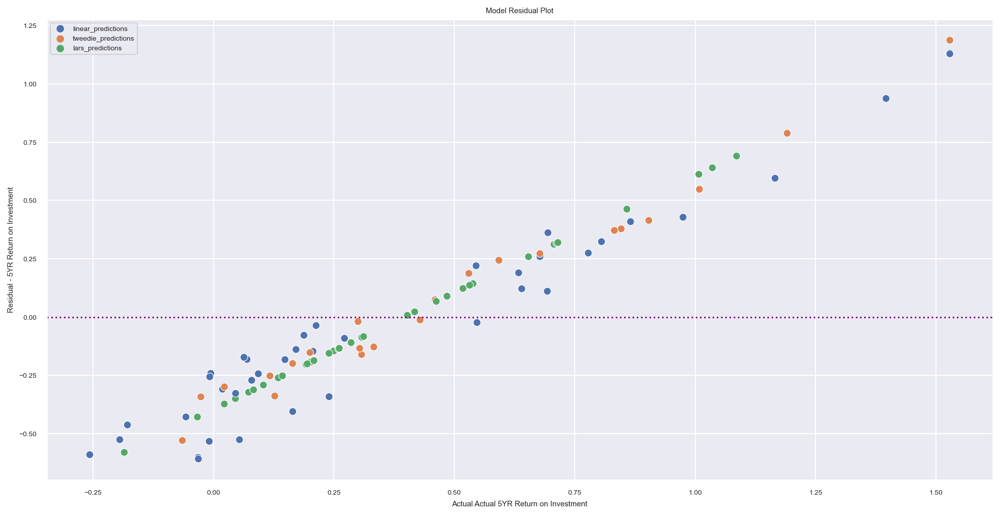

In [202]:
# melting columns for residual plot
melt_df = get_melted_table(cluster_predictions)

# plotting model residuals
plot_model_residuals(melt_df)

In [203]:
# plotting actual 5yr roi, baseline_predictions, and model predictions
def plot_models(melt_df):

    plt.figure(figsize = (16, 8))
    plt.plot(melt_df['roi_5yr'], melt_df['baseline_prediction'], alpha=0.5,
            color='gray', ls = ':', label='_nolegend_')

    plt.plot(melt_df['roi_5yr'], melt_df['roi_5yr'], alpha=0.5,
            color='blue', label = '_nolegend_')

    ax = sns.scatterplot(data = melt_df.sample(300, random_state = 123), 
            x = 'roi_5yr', 
            y = "vals", 
            hue = 'cols',
            y_jitter = .5,
            x_jitter = .5,
            s = 50)

    legend = ax.legend()
    plt.legend()
    plt.xlabel("Actual 5YR Return on Investment")
    plt.ylabel('Predicted 5YR Return on Investment')
    plt.title('Actual 5YR Return on Investment vs Predicted Cluster 5YR Return on Investment')
    plt.show()


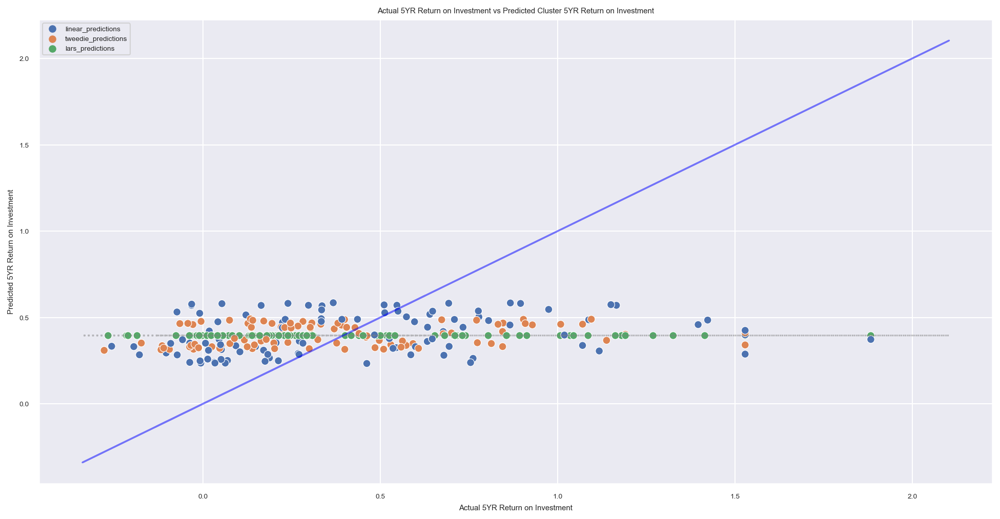

In [204]:
# predicted cluster 5yr roi vs. actual

plot_models(melt_df)

In [209]:
def model_distributions(df):
    # Distribution of my model predictions (linear & polynomial)
    plt.figure(figsize=(16,8))

    plt.hist(df['roi_5yr'], color='lightgray', alpha=0.5, label='Actual Log Error')

    plt.hist(df['linear_predictions'], color = 'red', alpha=0.5, label='Linear Regression w/PCA')

    plt.hist(df['lars_predictions'], color = 'tab:olive', alpha=0.5, label='LassoLars w/PCA')

    plt.hist(df['tweedie_predictions'], color = 'purple', alpha=0.5, label='Tweedie Regressor w/PCA')

    plt.xlabel('5YR ROI')
    plt.ylabel('Distribution')
    plt.title('Distribution of 5YR ROI by Predictive Model')
    plt.legend()

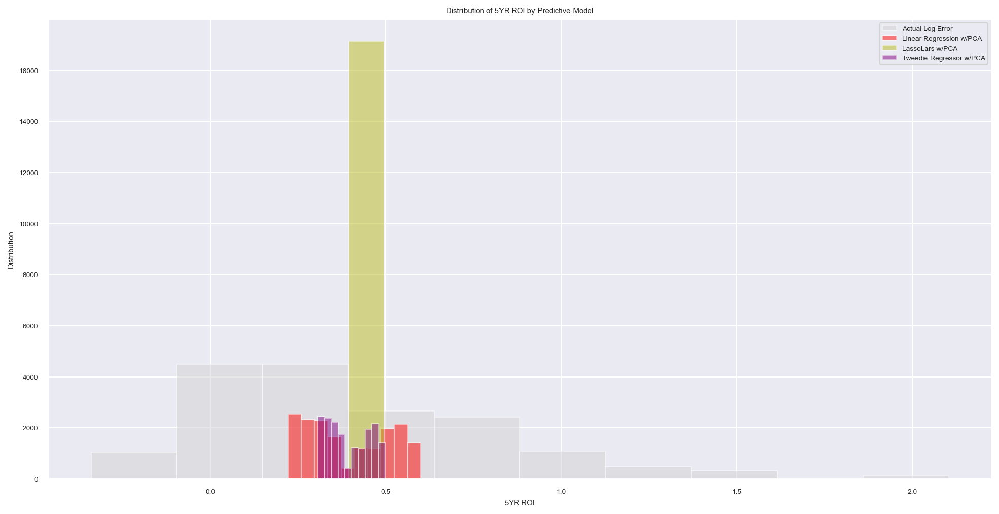

In [210]:
# plotting prediction distribution and evaluating against actual

model_distributions(cluster_predictions)

In [211]:
# deploy on test dataset

# generating a dataframe
test_df = pd.DataFrame(y_test_clusters)

pca_clusters = PCA(n_components = 2)
Xtrain_reduced_clusters = pca_clusters.fit_transform(X_train_clusters)

# transforming the test dataset
Xtest_reduced_clusters = pca_clusters.transform(X_test_clusters)

# generating model predictions
test_df["model_predictions"] = regr.predict(Xtest_reduced_clusters)
test_df.head()

,roi_5yr,model_predictions
48405,0.8068,0.484337
39468,0.1232,0.534494
12185,0.1405,0.353286
38075,0.3898,0.478934
32807,0.3899,0.237869


In [212]:
# returning R-squared score & RMSE on test dataset
rmse_test_clusters = sqrt(mean_squared_error(test_df['roi_5yr'], test_df['model_predictions']))

# print('Training R-squared w/Linear Model: {:.3f}'.format(lr_model.score(X_test, y_test)))
print('RMSE on Test Dataset Linear Regression w/PCA Cluster Model: {:.2f}'.format(rmse_test_clusters))

RMSE on Test Dataset Linear Regression w/PCA Cluster Model: 0.39
